In [1]:
import pandas as pd
import glob
import os
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import re
import pickle
import sklearn
import numpy as np
import nltk 
nltk.download('punkt')
nltk.download('stopwords')

# stemmer = SnowballStemmer("german")

[nltk_data] Downloading package punkt to /home/pawan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/pawan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [2]:
data = pd.read_csv("/home/pawan/Questionnaire_Updated.csv")

In [3]:
data

,Documents,file_name,Text,Ground_Truth
0,document1,Nacaps_2018,"""Ja, ich habe die Hinweise zum Datenschutz (si...","wissenschaftssystem, betreuung, wissenschaft..."
1,document2,WeGe_W2,"""Ich habe die Informationen zum Datenschutz ge...","integration, geflüchtete, studienkolleg, mi..."
2,document3,StuMa2020,""" Wenn Sie an Ihr letztes Studium\n\t\t\t\t\t\...","beruflicher verbleib von exmatrikulierten, st..."
3,document4,Studierdenensurvey2016,""" An welcher Art Hochschule\n\t\t\t\t\t\tstudi...","evaluation, qualifikation, effizienz, studi..."
4,document5,Absolventen_20092_Haupt,"""Welche der folgenden Tätigkeiten\n\t\t\t\t\t\...",hochschulforschung
5,document6,Promopanel_W4,"""Waren oder sind Sie\n\t\t\t\t\t\tseit der let...","promotion, hochschulforschung"
6,document7,Studienberechtigte_2008.3,Ich willige in die Teilnahme an der Befragung ...,"studienberechtigte, hochschulforschung"
7,document8,Wissenschaftlerbefragung2016,"""In welcher Sprache\n\t\t\t\t\t\tmöchten Sie d...",hochschulforschung
8,document9,Promopanel_W3,"""Ich willige in die Teilnahme an der Befragung...","promotion, hochschulforschung"
9,document10,Sozialerhebung20,Welches Hauptfach bzw. welche\n\t\t\t\t\t\tFäc...,hochschulforschung


In [4]:
file_name = ['Nacaps_2018','WeGe_W2','StuMa2020','Studierdenensurvey2016','Absolventen_20092_Haupt','Promopanel_W4','Studienberechtigte_2008.3',
'Wissenschaftlerbefragung2016','Promopanel_W3','Sozialerhebung20','WeGe_W3','Promopanel_W5','sid_corona','Promopanel_W2','Absolventen_2013-2','Absolventen_20092_Promotion',
'Sozialerhebung21','Absolventen_20092_Mobilität','Sozialerhebung19']

In [5]:
file_list2= ["/home/pawan/website_keywords_also_exist_within_documents/" + elem + ".txt" for elem in file_name]                  
GT_within_text = []

for file_path in file_list2:
    with open(file_path) as f_input:
        GT_within_text.append(f_input.read())

In [6]:
#lowercase ground_truth  words(which also exist within text documents)
GT_keywords_within_text = []
for item in GT_within_text:
    GT_keywords_within_text.append(item.lower())

In [7]:
GT_keywords_within_text

['wissenschaftssystem, betreuung, wissenschaftliche karriere, vereinbarkeit von familie und beruf, promovierende, promotion, finanzierung, mobilität, gesundheit, arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft',
 'geflüchtete,  studienkolleg, studienvorbereitung',
 'masterstudium ',
 'evaluation,  qualifikation, studiensituation',
 '',
 'promotion',
 '',
 '',
 'promotion',
 '',
 'geflüchtete,  studienkolleg, studienvorbereitung',
 'promotion',
 'digitale lehre, wohnsituation, studierende mit kind, studiensituation, corona',
 'promotion',
 '',
 '',
 '',
 '',
 '']

In [8]:
gt = list(data['Ground_Truth'])

In [9]:
gt

['wissenschaftssystem,  betreuung,  wissenschaftliche karriere,  promotionsformen,  promotionsmotive,  vereinbarkeit von familie und beruf,  monetäre erträge,  nicht-monetäre erträge,  wissenschaftlicher nachwuchs,  promotionsabbruch,  promovierende,  promotion,  strukturierte promotion,  persönlichkeit,  finanzierung,  mobilität,  gesundheit,  erwerbsverläufe,  arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft,  promovierte',
 'integration,  geflüchtete,  studienkolleg,  migration,  studienvorbereitung',
 'beruflicher verbleib von exmatrikulierten,  studiensituation,  studienabbruch,  masterstudium,  abbruchursachen',
 'evaluation,  qualifikation,  effizienz,  studiensituation,  zeitreihen,  studierendenbefragung,  hochschulforschung',
 'hochschulforschung',
 'promotion,  hochschulforschung',
 'studienberechtigte,  hochschulforschung',
 'hochschulforschung',
 'promotion,  hochschulforschung',
 'hochschulforschung',
 'integration,  geflüchtete,  studienkolleg,  migration,  st

In [10]:
ground_truth_not_in_text = ['promotionsformen, promotionsmotive,  monetäre erträge, nicht-monetäre erträge, wissenschaftlicher nachwuchs,promotionsabbruch, strukturierte promotion, persönlichkeit, erwerbsverläufe, promovierte',
                            'integration, migration', 
                            'beruflicher verbleib von exmatrikulierten, studiensituation, studienabbruch, abbruchursachen',
                            'effizienz, zeitreihen, studierendenbefragung, hochschulforschung', 
                            'hochschulforschung', 
                            'hochschulforschung',
                            'studienberechtigte, hochschulforschung', 
                            'hochschulforschung', 
                            'hochschulforschung',
                            'hochschulforschung',
                            'integration, migration', 
                            'hochschulforschung', 
                            'internationale studierende, finanzielle situation, studienerfolg, erwerbstätige studierende, persönlichkeit, beeinträchtigt studierende, studierende, gesundheit, studierendenforschung, hochschulforschung',
                            'hochschulforschung',
                            'absolventen, hochschulforschung', 
                            'hochschulforschung', 
                            'hochschulforschung', 
                            'hochschulforschung', 
                            'hochschulforschung']

In [11]:
ground_truth_not_in_text

['promotionsformen, promotionsmotive,  monetäre erträge, nicht-monetäre erträge, wissenschaftlicher nachwuchs,promotionsabbruch, strukturierte promotion, persönlichkeit, erwerbsverläufe, promovierte',
 'integration, migration',
 'beruflicher verbleib von exmatrikulierten, studiensituation, studienabbruch, abbruchursachen',
 'effizienz, zeitreihen, studierendenbefragung, hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'studienberechtigte, hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'integration, migration',
 'hochschulforschung',
 'internationale studierende, finanzielle situation, studienerfolg, erwerbstätige studierende, persönlichkeit, beeinträchtigt studierende, studierende, gesundheit, studierendenforschung, hochschulforschung',
 'hochschulforschung',
 'absolventen, hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung']

In [12]:
data['Valid_Ground_Truth'] = GT_keywords_within_text

In [13]:
data

,Documents,file_name,Text,Ground_Truth,Valid_Ground_Truth
0,document1,Nacaps_2018,"""Ja, ich habe die Hinweise zum Datenschutz (si...","wissenschaftssystem, betreuung, wissenschaft...","wissenschaftssystem, betreuung, wissenschaftli..."
1,document2,WeGe_W2,"""Ich habe die Informationen zum Datenschutz ge...","integration, geflüchtete, studienkolleg, mi...","geflüchtete, studienkolleg, studienvorbereitung"
2,document3,StuMa2020,""" Wenn Sie an Ihr letztes Studium\n\t\t\t\t\t\...","beruflicher verbleib von exmatrikulierten, st...",masterstudium
3,document4,Studierdenensurvey2016,""" An welcher Art Hochschule\n\t\t\t\t\t\tstudi...","evaluation, qualifikation, effizienz, studi...","evaluation, qualifikation, studiensituation"
4,document5,Absolventen_20092_Haupt,"""Welche der folgenden Tätigkeiten\n\t\t\t\t\t\...",hochschulforschung,
5,document6,Promopanel_W4,"""Waren oder sind Sie\n\t\t\t\t\t\tseit der let...","promotion, hochschulforschung",promotion
6,document7,Studienberechtigte_2008.3,Ich willige in die Teilnahme an der Befragung ...,"studienberechtigte, hochschulforschung",
7,document8,Wissenschaftlerbefragung2016,"""In welcher Sprache\n\t\t\t\t\t\tmöchten Sie d...",hochschulforschung,
8,document9,Promopanel_W3,"""Ich willige in die Teilnahme an der Befragung...","promotion, hochschulforschung",promotion
9,document10,Sozialerhebung20,Welches Hauptfach bzw. welche\n\t\t\t\t\t\tFäc...,hochschulforschung,


In [14]:
data['Ground_Truth_Not_In_Text'] = ground_truth_not_in_text

In [15]:
data

,Documents,file_name,Text,Ground_Truth,Valid_Ground_Truth,Ground_Truth_Not_In_Text
0,document1,Nacaps_2018,"""Ja, ich habe die Hinweise zum Datenschutz (si...","wissenschaftssystem, betreuung, wissenschaft...","wissenschaftssystem, betreuung, wissenschaftli...","promotionsformen, promotionsmotive, monetäre ..."
1,document2,WeGe_W2,"""Ich habe die Informationen zum Datenschutz ge...","integration, geflüchtete, studienkolleg, mi...","geflüchtete, studienkolleg, studienvorbereitung","integration, migration"
2,document3,StuMa2020,""" Wenn Sie an Ihr letztes Studium\n\t\t\t\t\t\...","beruflicher verbleib von exmatrikulierten, st...",masterstudium,"beruflicher verbleib von exmatrikulierten, stu..."
3,document4,Studierdenensurvey2016,""" An welcher Art Hochschule\n\t\t\t\t\t\tstudi...","evaluation, qualifikation, effizienz, studi...","evaluation, qualifikation, studiensituation","effizienz, zeitreihen, studierendenbefragung, ..."
4,document5,Absolventen_20092_Haupt,"""Welche der folgenden Tätigkeiten\n\t\t\t\t\t\...",hochschulforschung,,hochschulforschung
5,document6,Promopanel_W4,"""Waren oder sind Sie\n\t\t\t\t\t\tseit der let...","promotion, hochschulforschung",promotion,hochschulforschung
6,document7,Studienberechtigte_2008.3,Ich willige in die Teilnahme an der Befragung ...,"studienberechtigte, hochschulforschung",,"studienberechtigte, hochschulforschung"
7,document8,Wissenschaftlerbefragung2016,"""In welcher Sprache\n\t\t\t\t\t\tmöchten Sie d...",hochschulforschung,,hochschulforschung
8,document9,Promopanel_W3,"""Ich willige in die Teilnahme an der Befragung...","promotion, hochschulforschung",promotion,hochschulforschung
9,document10,Sozialerhebung20,Welches Hauptfach bzw. welche\n\t\t\t\t\t\tFäc...,hochschulforschung,,hochschulforschung


In [16]:
file_list3 = ["/home/pawan/website_keywords_also_exist_within_thesaurus/" + elem + ".txt" for elem in file_name]                  
GT_within_thesaurus = []

for file_path in file_list3:
    with open(file_path) as f_input:
        GT_within_thesaurus.append(f_input.read())

In [17]:
GT_within_thesaurus

['Betreuung, Vereinbarkeit von Familie und Beruf, Wissenschaftlicher Nachwuchs, Promotion, Persönlichkeit, Finanzierung, Mobilität, Gesundheit, ',
 'Integration, Migration',
 'Studiensituation, Studienabbruch',
 'Evaluation, Qualifikation, Effizienz, Studiensituation, Zeitreihen, Hochschulforschung',
 'Hochschulforschung',
 'Promotion, Hochschulforschung',
 'Hochschulforschung',
 'Hochschulforschung',
 'Promotion, Hochschulforschung',
 'Hochschulforschung',
 'Integration, Migration',
 'Promotion, Hochschulforschung',
 'finanzielle Situation, Studienerfolg, Persönlichkeit, Studiensituation, Gesundheit, Hochschulforschung',
 'Promotion, Hochschulforschung',
 'Hochschulforschung',
 'Hochschulforschung',
 'Hochschulforschung',
 'Hochschulforschung',
 'Hochschulforschung']

In [18]:
GT_within_thesaurus_not_in_text = ['Promotion, persönlichkeit', 'integration,migration', 'studiensituation, studienabbruch', 'Effizienz, zeitreihen, hochschulforschung',
                                  'hochschulforschung','hochschulforschung', 'hochschulforschung', 'hochschulforschung', 'hochschulforschung', 'hochschulforschung',
                                   'integration,migration', 'hochschulforschung', 'finanzielle Situation, Studienerfolg, Persönlichkeit, Gesundheit Hochschulforschung', 
                                  'Hochschulforschung', 'Hochschulforschung', 'hochschulforschung', 'hochschulforschung', 'hochschulforschung','hochschulforschung']

In [19]:
GT_within_thesaurus_not_in_text

['Promotion, persönlichkeit',
 'integration,migration',
 'studiensituation, studienabbruch',
 'Effizienz, zeitreihen, hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'integration,migration',
 'hochschulforschung',
 'finanzielle Situation, Studienerfolg, Persönlichkeit, Gesundheit Hochschulforschung',
 'Hochschulforschung',
 'Hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung',
 'hochschulforschung']

In [20]:
from nltk.corpus import stopwords
stop_words = stopwords.words('german')
stop_words
print(len(stop_words))
stop_words.extend(["a","ab","können","bzw", "usw","eu","wiwi","soz", "nah","dsh","and","eng","wahr", "kfz", "kiel", "öl", "fil" "sose", "ha","wi", "übt","wis","vwl","geben", "hhu","bitte","inkl", "läuft", "ggf", "ern", "te", "edv", "un","ver", "finno", "etc","ehe","kfw", "maße", "möchten", "cau", "juni", "uds", "innen", "aber","ach","acht","achte","achten","achter","achtes","ag","alle","fh","allein","allem","allen","aller","allerdings","alles","allgemeinen","als","also","am","an","andere","anderen","andern","anders","au","auch","auf","aus","ausser","außer","ausserdem","außerdem","b","bald","bei","beide","beiden","beim","beispiel","bekannt","bereits","besonders","besser","üben","besten","bin","sein","können","bis","bisher","bist","c","d","da","dabei","dadurch","dafür","dagegen","daher","dahin","dahinter","damals","damit","danach","daneben","dank","dann","daran","darauf","daraus","darf","darfst","darin","darüber","darum","darunter","das","dasein","daselbst","dass","daß","dasselbe","davon","davor","dazu","dazwischen","dein","deine","deinem","deiner","dem","dementsprechend","demgegenüber","demgemäss","demgemäß","demselben","demzufolge","den","denen","denn","denselben","saarlandes","der","deren","derjenige","derjenigen","dermassen","dermaßen","derselbe","derselben","des","deshalb","desselben","dessen","deswegen","d.h","dich","die","diejenige","diejenigen","dies","diese","dieselbe","dieselben","diesem","diesen","dieser","dieses","dir","doch","dort","drei","drin","dritte","dritten","dritter","drittes","du","durch","durchaus","dürfen","dürft","durfte","durften","e","eben","ebenso","ehrlich","ei","ei,","eigen","eigene","eigenen","eigener","eigenes","ein","einander","eine","einem","einen","einer","eines","einige","einigen","einiger","einiges","einmal","eins","elf","en","ende","endlich","entweder","er","Ernst","erst","erste","ersten","erster","erstes","es","etwa","etwas","euch","f","früher","fünf","fünfte","fünften","fünfter","fünftes","für","g","gab","ganz","ganze","ganzen","ganzer","ganzes","gar","gedurft","gegen","gegenüber","gehabt","gehen","geht","gekannt","gekonnt","gemacht","gemocht","gemusst","genug","gerade","gern","gesagt","geschweige","gewesen","gewollt","geworden","gibt","ging","gleich","gott","gross","groß","grosse","große","grossen","großen","grosser","großer","grosses","großes","gut","gute","guter","gutes","h","habe","haben","habt","hast","hat","hatte","hätte","hatten","hätten","heisst","her","heute","hier","hin","hinter","hoch","i","ich","ihm","ihn","ihnen","ihr","ihre","ihrem","ihren","ihrer","ihres","im","immer","in","indem","infolgedessen","ins","irgend","ist","j","ja","jahr","jahre","jahren","je","jede","jedem","jeden","jeder","jedermann","jedermanns","jedoch","jemand","jemandem","jemanden","jene","jenem","jenen","jener","jenes","jetzt","k","kam","kann","kannst","kaum","kein","keine","keinem","keinen","keiner","kleine","kleinen","kleiner","kleines","kommen","kommt","können","könnt","konnte","könnte","konnten","kurz","l",
                   "lang","lange","leicht","leide","lieber","los","m","inn","usw ","dfg","machen", "erc","macht","machte","mag","magst","mahn","man","manche","manchem","manchen","mancher","manches","mann","mehr","mein","meine","meinem","meinen","meiner","meines","mensch","menschen","mich","mir","mit","mittel","mochte","möchte","mochten","düsseldorf","mögen","möglich","mögt","morgen","muss","muß","müssen","musst","müsst","musste","mussten","n","na","nach","pogs","vater","mutter","nachdem","nahm","natürlich","neben","nein","neue","neuen","neun","neunte","neunten","neunter","neuntes","nicht","nichts","nie","niemand","niemandem","niemanden","noch","nun","nur","o","ob","oben","oder","offen","oft","ohne","Ordnung","p","q","r","recht","rechte","rechten","rechter","rechtes","richtig","rund","s","sa","sache","sagt","sagte","sah","satt","schlecht","Schluss","schon","sechs","sechste","sechsten","sechster","sechstes","sehr","sei","seid","seien","sein","seine","seinem","seinen","seiner","seines","seit","seitdem","selbst","sich","sie","sieben","siebente","siebenten","siebenter","siebentes","sind","so","solang","solche","solchem","solchen","solcher","solches","soll","sollen","sollte","sollten","sondern","sonst","sowie","später","statt","t","tag","tage","tagen","tat","teil","tel","tritt","trotzdem","tun","u","über","überhaupt","übrigens","uhr","um","und","und?","uns","unser","unsere","unserer","unter","v","vergangenen","viel","viele","vielem","vielen","vielleicht","vier","vierte","vierten","vierter","viertes","vom","vor","w","wahr?","während","währenddem","währenddessen","wann","war","wäre","waren","wart","warum","was","wegen","weil","weit","weiter","weitere","weiteren","weiteres","welche","welchem","welchen","welcher","welches","wem","wen","wenig","wenige","weniger","weniges","wenigstens","wenn","wer","werde","werden","werdet","wessen","wie","wieder","will","willst","wir","wird","wirklich","wirst","wo","wohl","wollen","wollt","wollte","wollten","worden","wurde","würde","wurden","würden","x","y","z","z.b","zehn","zehnte","zehnten","zehnter","zehntes","zeit","zu","zuerst","zugleich","zum","zunächst","zur","zurück","zusammen","zwanzig","zwar","zwei","zweite","zweiten","zweiter","zweites","zwischen","zwölf","euer","eure","hattest","hattet","jedes","mußt","müßt","sollst","sollt","soweit","weshalb","wieso","woher","wohin"])
print(len(stop_words))

232
877


In [21]:
def clean_text(text, for_embedding=False):
    """
        - remove any html tags (< /br> often found)
        - Keep only ASCII + European Chars and whitespace, no digits
        - remove single letter chars
        - convert all whitespaces (tabs etc.) to single wspace
        if not for embedding (but e.g. tdf-idf):
        - all lowercase
        - remove stopwords, punctuation and stemm
    """
    RE_WSPACE = re.compile(r"\s+", re.IGNORECASE)
    RE_TAGS = re.compile(r"<[^>]+>")
    RE_ASCII = re.compile(r"[^A-Za-zÀ-ž ]", re.IGNORECASE)
    RE_SINGLECHAR = re.compile(r"\b[A-Za-zÀ-ž]\b", re.IGNORECASE)
#     if for_embedding:
        # Keep punctuation
#         RE_ASCII = re.compile(r"[^A-Za-zÀ-ž,.!? ]", re.IGNORECASE)
#         RE_SINGLECHAR = re.compile(r"\b[A-Za-zÀ-ž,.!?]\b", re.IGNORECASE)

    text = re.sub(RE_TAGS, " ", text)
    text = re.sub(RE_ASCII, " ", text)
    text = re.sub(RE_SINGLECHAR, " ", text)
    text = re.sub(RE_WSPACE, " ", text)

    word_tokens = word_tokenize(text)
    words_tokens_lower = [word.lower() for word in word_tokens]

    if for_embedding:
        # no stemming, lowering and punctuation / stop words removal
        words_filtered = word_tokens
    else:
        words_filtered = [
            word for word in words_tokens_lower if word not in stop_words
        ] 

    text_clean = " ".join(words_filtered)
    return text_clean

In [22]:
data["clean_text"] = data["Text"].map(
    lambda x: clean_text(x, for_embedding=True) if isinstance(x, str) else x
)

In [23]:
data["clean_text"][0]

'Ja ich habe die Hinweise zum Datenschutz siehe Link weiter oben gelesen und bin damit einverstanden Die Hochschule an der Sie im Dezember zur Promotion registriert waren hat ebenfalls Interesse daran mehr über die Promotionsbedingungen ihrer Promovierenden zu erfahren Um Doppelbefragungen zu vermeiden möchten wir die von Ihnen innerhalb dieses Fragebogens angegebenen Antworten an Ihre Hochschule zum Zweck der Qualitätssicherung und Evaluation im Bereich der Doktorandenausbildung Ihr Einverständnis vorausgesetzt weiter geben Anfang Dezember waren Sie an Ihrer Hochschule offiziell als Doktorand in registriert In der Zwischenzeit kann sich daran etwas geändert haben Bitte geben Sie an was aktuell auf Sie zutrifft Aus welchen Gründen haben Sie das Promotionsvorhaben unterbrochen Aus welchen Gründen haben Sie das Promotionsvorhaben abgebrochen Handelt es sich um eine offiziell der Hochschule gemeldete Unterbrechung Warum haben Sie die Promotion begonnen Weil mich die Fragestellung interess

In [24]:
data["clean_text_wo_sw"] = data["Text"].map(
    lambda x: clean_text(x, for_embedding=False) if isinstance(x, str) else x
)

In [25]:
data["clean_text_wo_sw"][0]

'hinweise datenschutz siehe link gelesen einverstanden hochschule dezember promotion registriert ebenfalls interesse promotionsbedingungen promovierenden erfahren doppelbefragungen vermeiden innerhalb fragebogens angegebenen antworten hochschule zweck qualitätssicherung evaluation bereich doktorandenausbildung einverständnis vorausgesetzt anfang dezember hochschule offiziell doktorand registriert zwischenzeit geändert aktuell zutrifft gründen promotionsvorhaben unterbrochen gründen promotionsvorhaben abgebrochen handelt offiziell hochschule gemeldete unterbrechung promotion begonnen fragestellung interessiert wissenschaftlichen fortschritt beitragen fach üblich persönliches umfeld erwartet ergeben dauerhaft wissenschaftlich arbeiten lösung dringender gesellschaftlicher probleme beitragen ansehen steigern berufschancen außerakademischen arbeitsmarkt verbessern sonstiges inhaltlichen arbeit promotion begonnen erinnern quartal arbeiten begonnen erinnern quartal arbeiten begonnen hochschul

In [26]:
import spacy
nlp = spacy.load('de_core_news_lg')

In [27]:
#using spacy model for POS tagging

Extracted_Noun=[]
for i in range(len(data["clean_text"])):
    Extracted_Noun.append([])
    doc = nlp(data["clean_text"][i])
    for t in doc:
        tag=t.pos_
        if tag =="NOUN": # for Noun, only "NOUN"
            if t.text not in Extracted_Noun:
                Extracted_Noun[i].append((t.text, t.pos_))  #for appending to it as a tuples: constructing a tuple

In [28]:
Extracted_Noun[1]

[('Informationen', 'NOUN'),
 ('Datenschutz', 'NOUN'),
 ('willige', 'NOUN'),
 ('Teilnahme', 'NOUN'),
 ('Befragung', 'NOUN'),
 ('Verwendung', 'NOUN'),
 ('Daten', 'NOUN'),
 ('Zeit', 'NOUN'),
 ('Laune', 'NOUN'),
 ('Aufwachen', 'NOUN'),
 ('Alltag', 'NOUN'),
 ('Dinge', 'NOUN'),
 ('Screen', 'NOUN'),
 ('Aussagen', 'NOUN'),
 ('Pfeiltaste', 'NOUN'),
 ('Kurs', 'NOUN'),
 ('Kurs', 'NOUN'),
 ('Kurs', 'NOUN'),
 ('Sprachprüfung', 'NOUN'),
 ('Hochschulzugang', 'NOUN'),
 ('Feststellungsprüfung', 'NOUN'),
 ('Studienkollegs', 'NOUN'),
 ('Kurs', 'NOUN'),
 ('Sprachprüfung', 'NOUN'),
 ('Hochschulzugang', 'NOUN'),
 ('Feststellungsprüfung', 'NOUN'),
 ('Kurs', 'NOUN'),
 ('Befragung', 'NOUN'),
 ('Sprachprüfung', 'NOUN'),
 ('Sprachprüfung', 'NOUN'),
 ('Feststellungsprüfung', 'NOUN'),
 ('inkl', 'NOUN'),
 ('Sprachprüfung', 'NOUN'),
 ('Deutsch', 'NOUN'),
 ('Feststellungsprüfung', 'NOUN'),
 ('Sprachprüfung', 'NOUN'),
 ('Deutsch', 'NOUN'),
 ('Befreiung', 'NOUN'),
 ('Prüfung', 'NOUN'),
 ('Frage', 'NOUN'),
 ('Sprachprüf

In [29]:
#lemmatization on POS tagged text using GermaLemma

from germalemma import GermaLemma

lemmatizer = GermaLemma()

lemmatized_words = []

for i in range(len(Extracted_Noun)):
    lemmatized_words.append([])
    for j in range(len(Extracted_Noun[i])): 
            lemmatized_words[i].append(lemmatizer.find_lemma(Extracted_Noun[i][j][0], Extracted_Noun[i][j][1]))

In [30]:
lemmatized_words[0]

['Hinweis',
 'Datenschutz',
 'Link',
 'Hochschule',
 'Dezember',
 'Promotion',
 'Interesse',
 'Promotionsbedingung',
 'Promovierenden',
 'Doppelbefragung',
 'Fragebogen',
 'Antwort',
 'Hochschule',
 'Zweck',
 'Qualitätssicherung',
 'Evaluation',
 'Bereich',
 'Doktorandenausbildung',
 'Einverständnis',
 'Anfang',
 'Dezember',
 'Hochschule',
 'Doktorand',
 'Zwischenzeit',
 'Bitte',
 'Grund',
 'Promotionsvorhaben',
 'Grund',
 'Promotionsvorhaben',
 'Hochschule',
 'Unterbrechung',
 'Promotion',
 'Fragestellung',
 'Fortschritt',
 'Fach',
 'Umfeld',
 'Anderes',
 'Lösung',
 'Problem',
 'Ansehen',
 'Berufschance',
 'Arbeitsmarkt',
 'Sonstige',
 'Arbeit',
 'Promotion',
 'Quartal',
 'Arbeit',
 'Quartal',
 'Arbeit',
 'Hochschule',
 'Promotion',
 'Zulassungsantrag',
 'Quartal',
 'Promotion',
 'Hochschule',
 'Promotion',
 'Promotion',
 'Quartal',
 'Promotion',
 'Hochschule',
 'Hochschule',
 'Hochschule',
 'Promotion',
 'Hochschule',
 'Standort',
 'Forschungsbedingung',
 'Fach',
 'Betreuers',
 'Betr

In [31]:
# converting the list of tokens into string
lemmatized_corpus = [' '.join(x) for x in lemmatized_words]
print(lemmatized_corpus[0]) 

Hinweis Datenschutz Link Hochschule Dezember Promotion Interesse Promotionsbedingung Promovierenden Doppelbefragung Fragebogen Antwort Hochschule Zweck Qualitätssicherung Evaluation Bereich Doktorandenausbildung Einverständnis Anfang Dezember Hochschule Doktorand Zwischenzeit Bitte Grund Promotionsvorhaben Grund Promotionsvorhaben Hochschule Unterbrechung Promotion Fragestellung Fortschritt Fach Umfeld Anderes Lösung Problem Ansehen Berufschance Arbeitsmarkt Sonstige Arbeit Promotion Quartal Arbeit Quartal Arbeit Hochschule Promotion Zulassungsantrag Quartal Promotion Hochschule Promotion Promotion Quartal Promotion Hochschule Hochschule Hochschule Promotion Hochschule Standort Forschungsbedingung Fach Betreuers Betreuerin Rufs Hochschule Serviceangebot Promovierende Sonstige Promotionsverfahren Hochschule Ausland Abschluss Hochschule In Ausland Promotionsverfahren Fachhochschule Hochschule Wissenschaft Promotionsverfahren Fachhochschule Hochschule Wissenschaft Verwaltungshochschule Au

In [32]:
#adding column to the dataframe

data['clean_text_w_lemma']= lemmatized_corpus

In [33]:
data['clean_text_w_lemma'][0]

'Hinweis Datenschutz Link Hochschule Dezember Promotion Interesse Promotionsbedingung Promovierenden Doppelbefragung Fragebogen Antwort Hochschule Zweck Qualitätssicherung Evaluation Bereich Doktorandenausbildung Einverständnis Anfang Dezember Hochschule Doktorand Zwischenzeit Bitte Grund Promotionsvorhaben Grund Promotionsvorhaben Hochschule Unterbrechung Promotion Fragestellung Fortschritt Fach Umfeld Anderes Lösung Problem Ansehen Berufschance Arbeitsmarkt Sonstige Arbeit Promotion Quartal Arbeit Quartal Arbeit Hochschule Promotion Zulassungsantrag Quartal Promotion Hochschule Promotion Promotion Quartal Promotion Hochschule Hochschule Hochschule Promotion Hochschule Standort Forschungsbedingung Fach Betreuers Betreuerin Rufs Hochschule Serviceangebot Promovierende Sonstige Promotionsverfahren Hochschule Ausland Abschluss Hochschule In Ausland Promotionsverfahren Fachhochschule Hochschule Wissenschaft Promotionsverfahren Fachhochschule Hochschule Wissenschaft Verwaltungshochschule A

In [34]:
data

,Documents,file_name,Text,Ground_Truth,Valid_Ground_Truth,Ground_Truth_Not_In_Text,clean_text,clean_text_wo_sw,clean_text_w_lemma
0,document1,Nacaps_2018,"""Ja, ich habe die Hinweise zum Datenschutz (si...","wissenschaftssystem, betreuung, wissenschaft...","wissenschaftssystem, betreuung, wissenschaftli...","promotionsformen, promotionsmotive, monetäre ...",Ja ich habe die Hinweise zum Datenschutz siehe...,hinweise datenschutz siehe link gelesen einver...,Hinweis Datenschutz Link Hochschule Dezember P...
1,document2,WeGe_W2,"""Ich habe die Informationen zum Datenschutz ge...","integration, geflüchtete, studienkolleg, mi...","geflüchtete, studienkolleg, studienvorbereitung","integration, migration",Ich habe die Informationen zum Datenschutz gel...,informationen datenschutz gelesen willige teil...,Information Datenschutz Willige Teilnahme Befr...
2,document3,StuMa2020,""" Wenn Sie an Ihr letztes Studium\n\t\t\t\t\t\...","beruflicher verbleib von exmatrikulierten, st...",masterstudium,"beruflicher verbleib von exmatrikulierten, stu...",Wenn Sie an Ihr letztes Studium zurückdenken a...,letztes studium zurückdenken sommersemester wi...,Studium Sommersemester Wintersemester Merkmal ...
3,document4,Studierdenensurvey2016,""" An welcher Art Hochschule\n\t\t\t\t\t\tstudi...","evaluation, qualifikation, effizienz, studi...","evaluation, qualifikation, studiensituation","effizienz, zeitreihen, studierendenbefragung, ...",An welcher Art Hochschule studieren Sie Univer...,art hochschule studieren universität technisch...,Art Hochschule Universität Universität Fachhoc...
4,document5,Absolventen_20092_Haupt,"""Welche der folgenden Tätigkeiten\n\t\t\t\t\t\...",hochschulforschung,,hochschulforschung,Welche der folgenden Tätigkeiten üben Sie derz...,folgenden tätigkeiten derzeit erwerbstätig tra...,Tätigkeit Trainee Beschäftigung Praktikum Refe...
5,document6,Promopanel_W4,"""Waren oder sind Sie\n\t\t\t\t\t\tseit der let...","promotion, hochschulforschung",promotion,hochschulforschung,Waren oder sind Sie seit der letzten Befragung...,letzten befragung irgendeiner form erwerbstäti...,Ware Befragung Form Abschluss Promotion Form E...
6,document7,Studienberechtigte_2008.3,Ich willige in die Teilnahme an der Befragung ...,"studienberechtigte, hochschulforschung",,"studienberechtigte, hochschulforschung",Ich willige in die Teilnahme an der Befragung ...,willige teilnahme befragung beschriebene verwe...,Teilnahme Befragung Verwendung Datum Bildungs ...
7,document8,Wissenschaftlerbefragung2016,"""In welcher Sprache\n\t\t\t\t\t\tmöchten Sie d...",hochschulforschung,,hochschulforschung,In welcher Sprache möchten Sie die Befragung d...,sprache befragung durchführen please select yo...,Sprache Befragung Information Datennutzung Ein...
8,document9,Promopanel_W3,"""Ich willige in die Teilnahme an der Befragung...","promotion, hochschulforschung",promotion,hochschulforschung,Ich willige in die Teilnahme an der Befragung ...,willige teilnahme befragung beschriebene verwe...,Teilnahme Befragung Verwendung Datum Ware Befr...
9,document10,Sozialerhebung20,Welches Hauptfach bzw. welche\n\t\t\t\t\t\tFäc...,hochschulforschung,,hochschulforschung,Welches Hauptfach bzw welche Fächer studieren ...,hauptfach fächer studieren sommersemester fach...,Hauptfach Fach Sommersemester Fach Angabe Filt...


In [35]:
#Lemmatization on the corpus text which contains all the stopwords.

#spacy model does not have a good lemmatizer as the accuracy of the model for lemmatization is 73%

# clean_text_w_lemma_w_sw = []  # clean text with lemmatization

# for words in data["clean_text"]:
#      doc = nlp(words)
#      result = ' '.join([token.lemma_ for token in doc]) 
#      clean_text_w_lemma_w_sw.append(result)

In [36]:
sample_data = (data['clean_text']).tolist()

In [57]:
sample_data_wo_sw = (data['clean_text_wo_sw']).tolist()

In [37]:
sample_data_w_lemma= data['clean_text_w_lemma'].tolist()

In [38]:
new_df =data["clean_text_wo_sw"].str.split(expand=True).stack().value_counts().reset_index()
 
new_df.columns = ['Word', 'Frequency'] 
 
new_df

,Word,Frequency
0,tätigkeit,349
1,studium,292
2,folgenden,283
3,promotion,281
4,hochschule,182
...,...,...
6110,erachtens,1
6111,erproben,1
6112,leistungsfähigkeit,1
6113,kurze,1


In [39]:
len(new_df)

6115

In [40]:
new_df[0:5]

,Word,Frequency
0,tätigkeit,349
1,studium,292
2,folgenden,283
3,promotion,281
4,hochschule,182


(array([349.,   0., 292.,   0.,   0., 283.,   0., 281.,   0., 182.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <BarContainer object of 10 artists>)

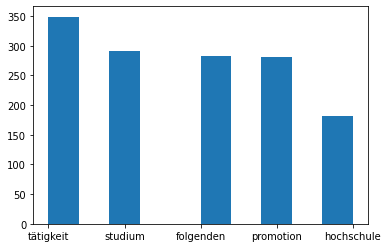

In [41]:
from matplotlib.pyplot import hist

hist(new_df[0:5].Word, weights=new_df[0:5].Frequency)

In [42]:
#Calculating Document Frequency

from collections import defaultdict
import math

DF = {}
for i in range(len(data['clean_text_w_lemma'])):
    tokens = nltk.word_tokenize(data['clean_text_w_lemma'][i]) #without nltk.word_tokenize, it gives character level DF
    for w in tokens:
            try:
                DF[w].add(i)
            except:
                DF[w] = {i}

In [43]:
DF.keys()

dict_keys(['Hinweis', 'Datenschutz', 'Link', 'Hochschule', 'Dezember', 'Promotion', 'Interesse', 'Promotionsbedingung', 'Promovierenden', 'Doppelbefragung', 'Fragebogen', 'Antwort', 'Zweck', 'Qualitätssicherung', 'Evaluation', 'Bereich', 'Doktorandenausbildung', 'Einverständnis', 'Anfang', 'Doktorand', 'Zwischenzeit', 'Bitte', 'Grund', 'Promotionsvorhaben', 'Unterbrechung', 'Fragestellung', 'Fortschritt', 'Fach', 'Umfeld', 'Anderes', 'Lösung', 'Problem', 'Ansehen', 'Berufschance', 'Arbeitsmarkt', 'Sonstige', 'Arbeit', 'Quartal', 'Zulassungsantrag', 'Standort', 'Forschungsbedingung', 'Betreuers', 'Betreuerin', 'Rufs', 'Serviceangebot', 'Promovierende', 'Promotionsverfahren', 'Ausland', 'Abschluss', 'In', 'Fachhochschule', 'Wissenschaft', 'Verwaltungshochschule', 'Aussage', 'Arbeitsvertrag', 'Teil', 'FH', 'Professor', 'Prüfer', 'Gutachter', 'Betreuer', 'Kooperationsvertrag', 'Universität', 'Betreuungsvereinbarung', 'Universitäts', 'Bezug', 'Promotionszeit', 'Dauer', 'Vorgabe', 'Antrag', 

In [44]:
len(DF) #Total Unique words

3066

In [45]:
for word,freq in DF.items():
    print(word,len(freq))

Hinweis 2
Datenschutz 4
Link 1
Hochschule 18
Dezember 2
Promotion 14
Interesse 12
Promotionsbedingung 1
Promovierenden 3
Doppelbefragung 1
Fragebogen 3
Antwort 3
Zweck 4
Qualitätssicherung 1
Evaluation 3
Bereich 8
Doktorandenausbildung 2
Einverständnis 2
Anfang 4
Doktorand 5
Zwischenzeit 1
Bitte 17
Grund 17
Promotionsvorhaben 2
Unterbrechung 2
Fragestellung 4
Fortschritt 2
Fach 10
Umfeld 6
Anderes 3
Lösung 4
Problem 14
Ansehen 6
Berufschance 6
Arbeitsmarkt 3
Sonstige 11
Arbeit 16
Quartal 1
Zulassungsantrag 1
Standort 6
Forschungsbedingung 1
Betreuers 2
Betreuerin 4
Rufs 2
Serviceangebot 1
Promovierende 2
Promotionsverfahren 1
Ausland 15
Abschluss 16
In 1
Fachhochschule 9
Wissenschaft 13
Verwaltungshochschule 1
Aussage 16
Arbeitsvertrag 4
Teil 9
FH 2
Professor 6
Prüfer 1
Gutachter 7
Betreuer 3
Kooperationsvertrag 1
Universität 12
Betreuungsvereinbarung 2
Universitäts 2
Bezug 10
Promotionszeit 1
Dauer 9
Vorgabe 2
Antrag 11
Annahme 1
Fakultät 2
Zulassung 5
Promotionsprüfungsverfahren 1
Ve

Beamter 2
Hochschulqualifikation 3
Arbeitsaufgabe 7
Tätigkeitsinhalt 8
Verdienst 11
Arbeitsbedingung 9
Beratungseinrichtung 1
Fortführung 1
Geburt 3
Familienstand 8
Lebenspartnerschaft 9
Universitätsabschluss 1
Fachhochschulabschluss 1
Meisterprüfung 1
Berufausbildung 1
Berufsgruppe 2
Akademiker 3
Arzt 7
Rechtsanwalt 3
Steuerberater 2
Dienst 10
Anweisung 5
Verkäufer 6
Sachbearbeiter 6
Fachverantwortung 5
Prokurist 3
Angestelltenverhältnis 1
Führungsaufgabe 5
Entscheidungsbefugnis 3
Direktor 5
Geschäftsführer 6
Vorstand 2
Facharbeiter 6
Vorarbeiter 2
Landwirt 3
Familienangehöriger 6
Akademikerin 1
Ärztin 6
Rechtsanwältin 2
Verkäuferin 1
Sachbearbeiterin 1
Buchhalterin 1
Mitarbeiterin 2
Abteilungsleiterin 1
Meisterin 1
Direktorin 1
Facharbeiterin 1
Vorarbeiterin 1
Landwirtin 1
Staantsangehörigkeit 1
Theologie 4
Religionslehre 2
Philosophie 4
Ethik 3
Geschichte 3
Archäologie 2
Medienkunde 2
Bibliothekswissenschaft 2
Dokumentation 1
Sprachwissenschaft 3
Latein 2
Griechische 2
Byzantinistik

Vertretungsprofessur 4
Bewertung 2
Veröffentlichung 5
Kongreß 5
Gutachtertätigkeit 4
Forschungsförderung 5
Gebrauchsmuster 4
Marke 4
Aufsatz 5
Review 5
Format 5
Poster 5
Designs 4
Erfinder 4
Anzahl 5
Urlaub 6
Bildungs 1
Berufsweg 1
Werdegangs 1
Sache 1
Überlegen 1
Risiko 1
Familienleben 1
Bekanntenkreis 1
Motiv 3
Bindung 2
Unabhängigkeit 1
Sachwissen 1
Breite 1
Berufsspektrum 1
Neigung 3
Wusch 1
Berufsberatung 1
Erachten 1
Leistungsfähigkeit 1
Ausbildungsdauer 1
Auslbildung 1
Beamtenausbildung 1
Auslbildungsberuf 1
Ausbilder 1
Lehrer 1
Berufspraxis 1
Ausbildungsleistung 1
Ausbildungen 1
Aufstiegsfortbildung 2
Techniker 2
Doppelqualifizierung 1
Verlegenheitslösung 1
Ausbildungsbetrieb 2
Übernommmen 1
Bildung 1
Arbeitsmarktlage 1
Schnittlich 1
Lernerfolg 1
Standard 1
Verknüpfung 2
Angemessenheit 2
Arbeitsaufwandes 1
Nachbereitungszeit 1
Studiensemester 1
Waisenrente 4
Waisengeld 4
HabenSie 1
Studienbelastung 3
Praxisnähe 1
Masterstudienplatz 1
Abschlussprüfung 1
Berufsakademie 1
Verwaltu

Abzahlung 1
Studiendarlehen 1
Gebühr 2
Semesterbeitrag 2
Rückmeldegebühr 1
Verwaltungskostenbeitrag 1
Sozialbeitrag 1
Studentenwerk 1
Studierendenschaft 2
Langzeitstudiengebühr 1
Hochschulort 1
Eigentümer 1
Flurgemeinschaft 1
Mehrzimmerwohnung 1
Mitbewohner 1
Großelternteil 1
Trägerschaft 1
Wohlfahrtsverband 1
Vermieter 2
Träger 1
Größe 1
Wohnraum 1
Einkaufsmöglichkeit 1
Freizeitangebot 1
Naherholungsgebiet 1
Verkehrsanbindung 1
Sommer 1
Winter 1
Beanspruchung 1
Bevölkerungsgruppe 1
Skala 1
Trinken 1
Café 1
Basteln 1
Skypen 1
Konsole 1
Tanz 1
Singen 1
Chor 1
Malerei 1
Fotografie 1
Reparatur 1
Gartenarbeit 1
Tanzaufführung 1
Rockkonzert 1
Club 1
Disco 1
Wochenzeitung 1
Shoppen 1
Bummeln 1
Faulenzen 1
Karte 1
Gesellschaftsspiele 1
Lesung 1
Poetry 1
Slam 1
Postleitzahl 1
Erhalt 1
Schultyp 1
Stadtteilschule 1
Sekundarschule 1
Oberstufenzentrum 1
Fachoberschule 1
Berufskolleg 1
Fachwirt 1
Erzieher 1
Eignungsfeststellung 1
Wehr 2
Zivil 1
Bundesfreiwilligendienst 1
Freiwilligendienst 1
Famili

In [46]:
df_list=[]
for word,freq in DF.items():
    df_list.append(tuple((word,len(freq)/19)))

In [47]:
df_list.sort(key=lambda x:x[1])

In [48]:
df_list

[('Link', 0.05263157894736842),
 ('Promotionsbedingung', 0.05263157894736842),
 ('Doppelbefragung', 0.05263157894736842),
 ('Qualitätssicherung', 0.05263157894736842),
 ('Zwischenzeit', 0.05263157894736842),
 ('Quartal', 0.05263157894736842),
 ('Zulassungsantrag', 0.05263157894736842),
 ('Forschungsbedingung', 0.05263157894736842),
 ('Serviceangebot', 0.05263157894736842),
 ('Promotionsverfahren', 0.05263157894736842),
 ('In', 0.05263157894736842),
 ('Verwaltungshochschule', 0.05263157894736842),
 ('Prüfer', 0.05263157894736842),
 ('Kooperationsvertrag', 0.05263157894736842),
 ('Promotionszeit', 0.05263157894736842),
 ('Annahme', 0.05263157894736842),
 ('Promotionsprüfungsverfahren', 0.05263157894736842),
 ('Promotionsprojekt', 0.05263157894736842),
 ('Stakeholdern', 0.05263157894736842),
 ('Richtung', 0.05263157894736842),
 ('Abschlussphase', 0.05263157894736842),
 ('Fächerauswahl', 0.05263157894736842),
 ('Stakeholder', 0.05263157894736842),
 ('Geldgebende', 0.05263157894736842),
 ('

In [49]:
check = [x[1] for x in df_list]

In [50]:
from collections import Counter
df_analysis = pd.DataFrame.from_dict(Counter(check), orient='index').reset_index()

In [51]:
df_analysis

,index,0
0,0.052632,1680
1,0.105263,543
2,0.157895,292
3,0.210526,151
4,0.263158,100
5,0.315789,83
6,0.368421,45
7,0.421053,45
8,0.473684,29
9,0.526316,17


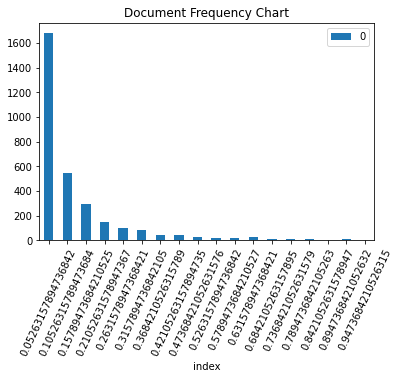

In [52]:
import matplotlib.pyplot as plot
# Draw a vertical bar chart

df_analysis.plot.bar(x="index", y=0, rot=65, title="Document Frequency Chart");

plot.show(block=True);

In [53]:
sample_data_w_lemma[0]

'Hinweis Datenschutz Link Hochschule Dezember Promotion Interesse Promotionsbedingung Promovierenden Doppelbefragung Fragebogen Antwort Hochschule Zweck Qualitätssicherung Evaluation Bereich Doktorandenausbildung Einverständnis Anfang Dezember Hochschule Doktorand Zwischenzeit Bitte Grund Promotionsvorhaben Grund Promotionsvorhaben Hochschule Unterbrechung Promotion Fragestellung Fortschritt Fach Umfeld Anderes Lösung Problem Ansehen Berufschance Arbeitsmarkt Sonstige Arbeit Promotion Quartal Arbeit Quartal Arbeit Hochschule Promotion Zulassungsantrag Quartal Promotion Hochschule Promotion Promotion Quartal Promotion Hochschule Hochschule Hochschule Promotion Hochschule Standort Forschungsbedingung Fach Betreuers Betreuerin Rufs Hochschule Serviceangebot Promovierende Sonstige Promotionsverfahren Hochschule Ausland Abschluss Hochschule In Ausland Promotionsverfahren Fachhochschule Hochschule Wissenschaft Promotionsverfahren Fachhochschule Hochschule Wissenschaft Verwaltungshochschule A

# Training on first 15 documents 

In [54]:
train_set = sample_data_w_lemma[0:15]

In [55]:
len(train_set)

15

In [57]:
from sklearn.feature_extraction.text import CountVectorizer 

cv=CountVectorizer(stop_words=stop_words,ngram_range=(1,1)) #min_df =0.05263 # trying different things

word_count_vector=cv.fit_transform(train_set) #training  ,  #model.fit

/home/pawan/.local/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ernst', 'ordnung', 'schluss'] not in stop_words.
  % sorted(inconsistent)


In [58]:
#the numbers are not counts, they are the position in the sparse vector.
cv.vocabulary_

{'hinweis': 1143,
 'datenschutz': 540,
 'link': 1494,
 'hochschule': 1152,
 'dezember': 559,
 'promotion': 1816,
 'interesse': 1219,
 'promotionsbedingung': 1819,
 'promovierenden': 1844,
 'doppelbefragung': 585,
 'fragebogen': 923,
 'antwort': 110,
 'zweck': 2633,
 'qualitätssicherung': 1898,
 'evaluation': 744,
 'bereich': 368,
 'doktorandenausbildung': 580,
 'einverständnis': 644,
 'anfang': 71,
 'doktorand': 578,
 'zwischenzeit': 2643,
 'grund': 1066,
 'promotionsvorhaben': 1837,
 'unterbrechung': 2323,
 'fragestellung': 924,
 'fortschritt': 918,
 'fach': 762,
 'umfeld': 2303,
 'lösung': 1505,
 'problem': 1791,
 'ansehen': 93,
 'berufschance': 387,
 'arbeitsmarkt': 139,
 'sonstige': 2081,
 'arbeit': 118,
 'quartal': 1902,
 'zulassungsantrag': 2613,
 'standort': 2127,
 'forschungsbedingung': 885,
 'betreuers': 440,
 'betreuerin': 439,
 'rufs': 1973,
 'serviceangebot': 2061,
 'promovierende': 1843,
 'promotionsverfahren': 1836,
 'ausland': 246,
 'abschluss': 16,
 'fachhochschule': 77

In [59]:
word_count_vector.shape

(15, 2668)

In [60]:
cv.stop_words #gives you the stop words that CountVectorizer inferred from your min_df and max_df settings as well as those that were cut off during feature selection (through the use of max_features)

['aber',
 'alle',
 'allem',
 'allen',
 'aller',
 'alles',
 'als',
 'also',
 'am',
 'an',
 'ander',
 'andere',
 'anderem',
 'anderen',
 'anderer',
 'anderes',
 'anderm',
 'andern',
 'anderr',
 'anders',
 'auch',
 'auf',
 'aus',
 'bei',
 'bin',
 'bis',
 'bist',
 'da',
 'damit',
 'dann',
 'der',
 'den',
 'des',
 'dem',
 'die',
 'das',
 'dass',
 'daß',
 'derselbe',
 'derselben',
 'denselben',
 'desselben',
 'demselben',
 'dieselbe',
 'dieselben',
 'dasselbe',
 'dazu',
 'dein',
 'deine',
 'deinem',
 'deinen',
 'deiner',
 'deines',
 'denn',
 'derer',
 'dessen',
 'dich',
 'dir',
 'du',
 'dies',
 'diese',
 'diesem',
 'diesen',
 'dieser',
 'dieses',
 'doch',
 'dort',
 'durch',
 'ein',
 'eine',
 'einem',
 'einen',
 'einer',
 'eines',
 'einig',
 'einige',
 'einigem',
 'einigen',
 'einiger',
 'einiges',
 'einmal',
 'er',
 'ihn',
 'ihm',
 'es',
 'etwas',
 'euer',
 'eure',
 'eurem',
 'euren',
 'eurer',
 'eures',
 'für',
 'gegen',
 'gewesen',
 'hab',
 'habe',
 'haben',
 'hat',
 'hatte',
 'hatten',
 '

In [61]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer=TfidfTransformer(smooth_idf=True,use_idf=True)

tfidf_transformer.fit(word_count_vector)

TfidfTransformer()

In [62]:
feature_names=cv.get_feature_names()

/home/pawan/.local/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [64]:
# feature_names.index('mobilität')

In [65]:
def sort_coo(coo_matrix):
    tuples = zip(coo_matrix.col, coo_matrix.data)
    return sorted(tuples, key=lambda x: (x[1], x[0]), reverse=True)

def extract_topn_from_vector(feature_names, sorted_items, topn):
    """get the feature names and tf-idf score of top n items"""
    
    #use only topn items from vector
    sorted_items = sorted_items[:topn]

    score_vals = []
    feature_vals = []
    
    # word index and corresponding tf-idf score
    for idx, score in sorted_items:
        
        #keep track of feature name and its corresponding score
        score_vals.append(round(score, 3))
        feature_vals.append(feature_names[idx])

    #create a tuples of feature,score
    #results = zip(feature_vals,score_vals)
    results= {}
    for idx in range(len(feature_vals)):
        results[feature_vals[idx]]=score_vals[idx]
    
    return results

def get_keywords(vectorizer, feature_names, doc):
    """Return top k keywords from a doc using TF-IDF method"""

    #generate tf-idf for the given document
    tf_idf_vector = vectorizer.transform(cv.transform([doc]))
    
    #sort the tf-idf vectors by descending order of scores
    sorted_items=sort_coo(tf_idf_vector.tocoo())

    #extract only TOP_K_KEYWORDS
    keywords=extract_topn_from_vector(feature_names,sorted_items,200)
    
    return (keywords)


In [66]:
result = []
for doc in train_set:
    df = {}
    df['Text'] = doc
    df['top_keywords'] = get_keywords(tfidf_transformer, feature_names, doc)
    result.append(df)
    
final = pd.DataFrame(result)
final

,Text,top_keywords
0,Hinweis Datenschutz Link Hochschule Dezember P...,"{'promotion': 0.509, 'betreuer': 0.299, 'hochs..."
1,Information Datenschutz Willige Teilnahme Befr...,"{'kurs': 0.423, 'deutsch': 0.407, 'vorbereitun..."
2,Studium Sommersemester Wintersemester Merkmal ...,"{'masterstudium': 0.604, 'studium': 0.344, 'ma..."
3,Art Hochschule Universität Universität Fachhoc...,"{'fach': 0.316, 'studium': 0.232, 'sprache': 0..."
4,Tätigkeit Trainee Beschäftigung Praktikum Refe...,"{'tätigkeit': 0.366, 'weiterbildung': 0.283, '..."
5,Ware Befragung Form Abschluss Promotion Form E...,"{'tätigkeit': 0.432, 'dienst': 0.27, 'rätin': ..."
6,Teilnahme Befragung Verwendung Datum Bildungs ...,"{'studium': 0.571, 'bereich': 0.207, 'ausbildu..."
7,Sprache Befragung Information Datennutzung Ein...,"{'kollege': 0.262, 'wissenschaftlerinnen': 0.2..."
8,Teilnahme Befragung Verwendung Datum Ware Befr...,"{'ausland': 0.363, 'tätigkeit': 0.319, 'stelle..."
9,Hauptfach Fach Sommersemester Fach Angabe Filt...,"{'auslandsaufenthalt': 0.343, 'tätigkeit': 0.2..."


In [68]:
len(final['top_keywords'][14]) # document 8 have 189 keywords(<topk(200)) and document 14 have 187 keywords

187

In [80]:
final['top_keywords'][0]

{'promotion': 0.498,
 'betreuer': 0.286,
 'hochschule': 0.151,
 'betreuende': 0.147,
 'fakultät': 0.129,
 'vertrag': 0.119,
 'stelle': 0.117,
 'promotionsprogramm': 0.116,
 'thema': 0.114,
 'aussage': 0.111,
 'beratung': 0.109,
 'promovierende': 0.109,
 'sonstige': 0.109,
 'selbstständigkeit': 0.102,
 'promotionsverfahren': 0.102,
 'promotionsprojekt': 0.102,
 'forschungs': 0.098,
 'betreuung': 0.097,
 'person': 0.093,
 'wissenschaft': 0.093,
 'mitgliedschaft': 0.09,
 'entscheidungsprozess': 0.09,
 'verfassen': 0.089,
 'hauptbetreuer': 0.089,
 'bezug': 0.087,
 'bereich': 0.086,
 'unternehmen': 0.082,
 'forschungseinrichtung': 0.08,
 'tätigkeit': 0.079,
 'kulturinstitution': 0.079,
 'karriereentwicklung': 0.079,
 'graduiertenakademie': 0.079,
 'arbeitsvertrag': 0.073,
 'forschungsinstitut': 0.071,
 'kurs': 0.07,
 'inhalt': 0.07,
 'hauptbetreuerin': 0.069,
 'betreuungsvereinbarung': 0.069,
 'beratungs': 0.069,
 'praxis': 0.069,
 'eltern': 0.069,
 'zufriedenheit': 0.068,
 'qualifizierungs

In [81]:
final['Valid_Ground_Truth']= data ['Valid_Ground_Truth']

In [82]:
doc0 = list(final['top_keywords'][0])

In [83]:
doc0

['promotion',
 'betreuer',
 'hochschule',
 'betreuende',
 'fakultät',
 'vertrag',
 'stelle',
 'promotionsprogramm',
 'thema',
 'aussage',
 'beratung',
 'promovierende',
 'sonstige',
 'selbstständigkeit',
 'promotionsverfahren',
 'promotionsprojekt',
 'forschungs',
 'betreuung',
 'person',
 'wissenschaft',
 'mitgliedschaft',
 'entscheidungsprozess',
 'verfassen',
 'hauptbetreuer',
 'bezug',
 'bereich',
 'unternehmen',
 'forschungseinrichtung',
 'tätigkeit',
 'kulturinstitution',
 'karriereentwicklung',
 'graduiertenakademie',
 'arbeitsvertrag',
 'forschungsinstitut',
 'kurs',
 'inhalt',
 'hauptbetreuerin',
 'betreuungsvereinbarung',
 'beratungs',
 'praxis',
 'eltern',
 'zufriedenheit',
 'qualifizierungsziel',
 'nebenabsprache',
 'fachdisziplin',
 'betreuerin',
 'partner',
 'arbeit',
 'stiftung',
 'programm',
 'mitglied',
 'karriere',
 'entwicklungsbezug',
 'stand',
 'behörde',
 'stakeholdern',
 'promotionsthema',
 'phase',
 'informationsquelle',
 'auswahlverfahren',
 'universität',
 'st

In [84]:
spliting= final['Valid_Ground_Truth'][0]

In [85]:
spliting

'wissenschaftssystem, betreuung, wissenschaftliche karriere, vereinbarkeit von familie und beruf, promovierende, promotion, finanzierung, mobilität, gesundheit, arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft'

In [86]:
w = spliting.strip()

In [87]:
w

'wissenschaftssystem, betreuung, wissenschaftliche karriere, vereinbarkeit von familie und beruf, promovierende, promotion, finanzierung, mobilität, gesundheit, arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft'

In [88]:
gt_doc0 = w.split(',')

In [89]:
gt_doc0

['wissenschaftssystem',
 ' betreuung',
 ' wissenschaftliche karriere',
 ' vereinbarkeit von familie und beruf',
 ' promovierende',
 ' promotion',
 ' finanzierung',
 ' mobilität',
 ' gesundheit',
 ' arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft']

In [90]:
gt_doc1= [elm.strip() for elm in gt_doc0]

In [91]:
list(set(gt_doc1) - set(doc0))

['mobilität',
 'wissenschaftssystem',
 'vereinbarkeit von familie und beruf',
 'wissenschaftliche karriere',
 'arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft']

In [92]:
#for uniqueness

In [93]:
# #Calculating Document Frequency

# from collections import defaultdict
# import math

# DF2 = {}
# for i in range(len(final)):
#     for elem in list((final['top_keywords'])[i].keys()):
#         tokens = nltk.word_tokenize(elem) #without nltk.word_tokenize, it gives character level DF
#         for w in tokens:
#             try:
#                 DF2[w].add(i)
#             except:
#                 DF2[w] = {i}

In [94]:
# DF2

In [95]:
# len(DF2)

In [96]:
# for word,freq in DF2.items():
#     print(word,len(freq))

In [97]:
# df_list1=[]
# for word,freq in DF2.items():
#     df_list1.append(tuple((word,len(freq)/19)))

In [98]:
# df_list1

In [99]:
# for uniquenees we can take the amount(count/Frequency) of documents that a keyword occurs in and then dividing it by the total amount of documents.(Document frequency)

# something that comes in 19 out of 19 questionnaire, we can be sure that it is not unique and something that comes in 1 out of 19 it’s very unique.

# we can define a threshold on document frquency and based on that can define the uniqueness/decisiveness of keyword
# for i in range(len(final)):
#     for elem in list((final['top_keywords'])[i].keys()):
        

In [100]:
type(final['top_keywords'])

pandas.core.series.Series

In [101]:
final['Ground_Truth']= data['Ground_Truth'] 

In [102]:
final

,Text,top_keywords,Valid_Ground_Truth,Ground_Truth
0,Hinweis Datenschutz Link Hochschule Dezember P...,"{'promotion': 0.498, 'betreuer': 0.286, 'hochs...","wissenschaftssystem, betreuung, wissenschaftli...","wissenschaftssystem, betreuung, wissenschaft..."
1,Information Datenschutz Willige Teilnahme Befr...,"{'kurs': 0.444, 'deutsch': 0.415, 'vorbereitun...","geflüchtete, studienkolleg, studienvorbereitung","integration, geflüchtete, studienkolleg, mi..."
2,Studium Sommersemester Wintersemester Merkmal ...,"{'masterstudium': 0.609, 'studium': 0.327, 'ma...",masterstudium,"beruflicher verbleib von exmatrikulierten, st..."
3,Art Hochschule Universität Universität Fachhoc...,"{'fach': 0.3, 'studium': 0.231, 'sprache': 0.1...","evaluation, qualifikation, studiensituation","evaluation, qualifikation, effizienz, studi..."
4,Tätigkeit Trainee Beschäftigung Praktikum Refe...,"{'tätigkeit': 0.342, 'weiterbildung': 0.311, '...",,hochschulforschung
5,Ware Befragung Form Abschluss Promotion Form E...,"{'tätigkeit': 0.392, 'dienst': 0.292, 'rätin':...",promotion,"promotion, hochschulforschung"
6,Teilnahme Befragung Verwendung Datum Bildungs ...,"{'studium': 0.554, 'bereich': 0.215, 'ausbildu...",,"studienberechtigte, hochschulforschung"
7,Sprache Befragung Information Datennutzung Ein...,"{'kollege': 0.27, 'wissenschaftlerinnen': 0.21...",,hochschulforschung
8,Teilnahme Befragung Verwendung Datum Ware Befr...,"{'ausland': 0.333, 'tätigkeit': 0.301, 'stelle...",promotion,"promotion, hochschulforschung"
9,Hauptfach Fach Sommersemester Fach Angabe Filt...,"{'auslandsaufenthalt': 0.342, 'tätigkeit': 0.2...",,hochschulforschung


In [103]:
# final.to_csv("keywords_After_POS.csv")

In [104]:
predicted=[]
chunk_size = 1 #coz max ground truth size is 20
for i in range(len(final['top_keywords'])):
    predicted.append([])           #used for nested list
    for j in range(1,int(200/chunk_size)+1):
        predicted[i].append(list(final['top_keywords'][i].keys())[0:j*chunk_size])

In [105]:
predicted

[[['promotion'],
  ['promotion', 'betreuer'],
  ['promotion', 'betreuer', 'hochschule'],
  ['promotion', 'betreuer', 'hochschule', 'betreuende'],
  ['promotion', 'betreuer', 'hochschule', 'betreuende', 'fakultät'],
  ['promotion', 'betreuer', 'hochschule', 'betreuende', 'fakultät', 'vertrag'],
  ['promotion',
   'betreuer',
   'hochschule',
   'betreuende',
   'fakultät',
   'vertrag',
   'stelle'],
  ['promotion',
   'betreuer',
   'hochschule',
   'betreuende',
   'fakultät',
   'vertrag',
   'stelle',
   'promotionsprogramm'],
  ['promotion',
   'betreuer',
   'hochschule',
   'betreuende',
   'fakultät',
   'vertrag',
   'stelle',
   'promotionsprogramm',
   'thema'],
  ['promotion',
   'betreuer',
   'hochschule',
   'betreuende',
   'fakultät',
   'vertrag',
   'stelle',
   'promotionsprogramm',
   'thema',
   'aussage'],
  ['promotion',
   'betreuer',
   'hochschule',
   'betreuende',
   'fakultät',
   'vertrag',
   'stelle',
   'promotionsprogramm',
   'thema',
   'aussage',
  

In [106]:
len(predicted[0])   #predicted[0][-1] shows all the keywords in document 0, that is 200 keywords

200

In [107]:
len(data['Ground_Truth'])

19

In [108]:
final['Ground_Truth']

0     wissenschaftssystem,  betreuung,  wissenschaft...
1     integration,  geflüchtete,  studienkolleg,  mi...
2     beruflicher verbleib von exmatrikulierten,  st...
3     evaluation,  qualifikation,  effizienz,  studi...
4                                    hochschulforschung
5                        promotion,  hochschulforschung
6               studienberechtigte,  hochschulforschung
7                                    hochschulforschung
8                        promotion,  hochschulforschung
9                                    hochschulforschung
10    integration,  geflüchtete,  studienkolleg,  mi...
11                       promotion,  hochschulforschung
12    internationale studierende,  digitale lehre,  ...
13                       promotion,  hochschulforschung
14                     absolventen,  hochschulforschung
15                                   hochschulforschung
16                                   hochschulforschung
17                                   hochschulfo

In [109]:
gt_for_top_15 = list(final['Ground_Truth']) #it will append the ground truth for top 15 documents so length of ground truth documents here is 15

In [110]:
len(gt_for_top_15)

19

In [111]:
ground_truth =[]
for i in range(len(gt_for_top_15)):
    ground_truth.append([gt_for_top_15[i]])

In [112]:
for i in range(len(ground_truth)):
    ground_truth[i]= ground_truth[i][0].split(",")

In [113]:
for i in range(len(ground_truth)):
    for j in range(len(ground_truth[i])):
        ground_truth[i][j] = ground_truth[i][j].strip()

In [114]:
ground_truth

[['wissenschaftssystem',
  'betreuung',
  'wissenschaftliche karriere',
  'promotionsformen',
  'promotionsmotive',
  'vereinbarkeit von familie und beruf',
  'monetäre erträge',
  'nicht-monetäre erträge',
  'wissenschaftlicher nachwuchs',
  'promotionsabbruch',
  'promovierende',
  'promotion',
  'strukturierte promotion',
  'persönlichkeit',
  'finanzierung',
  'mobilität',
  'gesundheit',
  'erwerbsverläufe',
  'arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft',
  'promovierte'],
 ['integration',
  'geflüchtete',
  'studienkolleg',
  'migration',
  'studienvorbereitung'],
 ['beruflicher verbleib von exmatrikulierten',
  'studiensituation',
  'studienabbruch',
  'masterstudium',
  'abbruchursachen'],
 ['evaluation',
  'qualifikation',
  'effizienz',
  'studiensituation',
  'zeitreihen',
  'studierendenbefragung',
  'hochschulforschung'],
 ['hochschulforschung'],
 ['promotion', 'hochschulforschung'],
 ['studienberechtigte', 'hochschulforschung'],
 ['hochschulforschung'],
 

In [115]:
ground_truth[0]

['wissenschaftssystem',
 'betreuung',
 'wissenschaftliche karriere',
 'promotionsformen',
 'promotionsmotive',
 'vereinbarkeit von familie und beruf',
 'monetäre erträge',
 'nicht-monetäre erträge',
 'wissenschaftlicher nachwuchs',
 'promotionsabbruch',
 'promovierende',
 'promotion',
 'strukturierte promotion',
 'persönlichkeit',
 'finanzierung',
 'mobilität',
 'gesundheit',
 'erwerbsverläufe',
 'arbeitsmarkterfolg innerhalb und außerhalb der wissenschaft',
 'promovierte']

In [116]:
final['top_keywords'][0]

{'promotion': 0.498,
 'betreuer': 0.286,
 'hochschule': 0.151,
 'betreuende': 0.147,
 'fakultät': 0.129,
 'vertrag': 0.119,
 'stelle': 0.117,
 'promotionsprogramm': 0.116,
 'thema': 0.114,
 'aussage': 0.111,
 'beratung': 0.109,
 'promovierende': 0.109,
 'sonstige': 0.109,
 'selbstständigkeit': 0.102,
 'promotionsverfahren': 0.102,
 'promotionsprojekt': 0.102,
 'forschungs': 0.098,
 'betreuung': 0.097,
 'person': 0.093,
 'wissenschaft': 0.093,
 'mitgliedschaft': 0.09,
 'entscheidungsprozess': 0.09,
 'verfassen': 0.089,
 'hauptbetreuer': 0.089,
 'bezug': 0.087,
 'bereich': 0.086,
 'unternehmen': 0.082,
 'forschungseinrichtung': 0.08,
 'tätigkeit': 0.079,
 'kulturinstitution': 0.079,
 'karriereentwicklung': 0.079,
 'graduiertenakademie': 0.079,
 'arbeitsvertrag': 0.073,
 'forschungsinstitut': 0.071,
 'kurs': 0.07,
 'inhalt': 0.07,
 'hauptbetreuerin': 0.069,
 'betreuungsvereinbarung': 0.069,
 'beratungs': 0.069,
 'praxis': 0.069,
 'eltern': 0.069,
 'zufriedenheit': 0.068,
 'qualifizierungs

In [117]:
len(ground_truth)

19

In [118]:
len(list(final['top_keywords']))

19

In [119]:
######################################################
# function to evaluate success of keyword extraction #
######################################################
def evaluate_keywords(proposed,groundtruth):
  """
  Returns precision, recall, and f1 score for proposed keywords against ground truth
  """
  proposed_set = set(proposed)
  true_set = set(groundtruth)
  
  true_positives = len(proposed_set.intersection(true_set))
  if len(proposed_set)==0:
    precision = 0
  else:
    # note denominator reflects total number of words
    # not total number of unique words
    precision = true_positives/float(len(proposed)) 
      
  if len(true_set)==0:
    recall = 0
  else:
    recall = true_positives/float(len(true_set))
  
  if precision + recall > 0:
    f1 = 2*precision*recall/float(precision + recall)
  else:
    f1 = 0

  return (precision, recall, f1)

In [120]:
metric_values = []
for i in range(len(predicted)):
    metric_values.append([]) 
    for j in range(len(predicted[i])):
        metric_values[i].append(evaluate_keywords(predicted[i][j], ground_truth[i]))

In [121]:
len(metric_values[0])

200

In [122]:
metric_values

[[(1.0, 0.05, 0.09523809523809523),
  (0.5, 0.05, 0.09090909090909091),
  (0.3333333333333333, 0.05, 0.08695652173913045),
  (0.25, 0.05, 0.08333333333333334),
  (0.2, 0.05, 0.08000000000000002),
  (0.16666666666666666, 0.05, 0.07692307692307691),
  (0.14285714285714285, 0.05, 0.07407407407407408),
  (0.125, 0.05, 0.07142857142857144),
  (0.1111111111111111, 0.05, 0.06896551724137932),
  (0.1, 0.05, 0.06666666666666667),
  (0.09090909090909091, 0.05, 0.06451612903225806),
  (0.16666666666666666, 0.1, 0.125),
  (0.15384615384615385, 0.1, 0.12121212121212123),
  (0.14285714285714285, 0.1, 0.11764705882352941),
  (0.13333333333333333, 0.1, 0.1142857142857143),
  (0.125, 0.1, 0.11111111111111112),
  (0.11764705882352941, 0.1, 0.1081081081081081),
  (0.16666666666666666, 0.15, 0.15789473684210525),
  (0.15789473684210525, 0.15, 0.15384615384615385),
  (0.15, 0.15, 0.15),
  (0.14285714285714285, 0.15, 0.14634146341463414),
  (0.13636363636363635, 0.15, 0.14285714285714282),
  (0.130434782608

In [123]:
precison_values = []

for i in range(len(metric_values)):
    precison_values.append([])
    for a_tuple in metric_values[i]:
        precison_values[i].append(a_tuple[0])

In [124]:
len(precison_values[0])

200

In [125]:
precison_values[0]

[1.0,
 0.5,
 0.3333333333333333,
 0.25,
 0.2,
 0.16666666666666666,
 0.14285714285714285,
 0.125,
 0.1111111111111111,
 0.1,
 0.09090909090909091,
 0.16666666666666666,
 0.15384615384615385,
 0.14285714285714285,
 0.13333333333333333,
 0.125,
 0.11764705882352941,
 0.16666666666666666,
 0.15789473684210525,
 0.15,
 0.14285714285714285,
 0.13636363636363635,
 0.13043478260869565,
 0.125,
 0.12,
 0.11538461538461539,
 0.1111111111111111,
 0.10714285714285714,
 0.10344827586206896,
 0.1,
 0.0967741935483871,
 0.09375,
 0.09090909090909091,
 0.08823529411764706,
 0.08571428571428572,
 0.08333333333333333,
 0.08108108108108109,
 0.07894736842105263,
 0.07692307692307693,
 0.075,
 0.07317073170731707,
 0.07142857142857142,
 0.06976744186046512,
 0.06818181818181818,
 0.06666666666666667,
 0.06521739130434782,
 0.06382978723404255,
 0.0625,
 0.061224489795918366,
 0.06,
 0.058823529411764705,
 0.057692307692307696,
 0.05660377358490566,
 0.05555555555555555,
 0.05454545454545454,
 0.053571428

In [126]:
recall_values = []
for i in range(len(metric_values)):
    recall_values.append([])
    for a_tuple in metric_values[i]:
        recall_values[i].append(a_tuple[1])

In [127]:
recall_values[0]

[0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.2,

In [128]:
f1_score = []
for i in range(len(metric_values)):
    f1_score.append([])
    for a_tuple in metric_values[i]:
        f1_score[i].append(a_tuple[2])

In [129]:
f1_score[0]

[0.09523809523809523,
 0.09090909090909091,
 0.08695652173913045,
 0.08333333333333334,
 0.08000000000000002,
 0.07692307692307691,
 0.07407407407407408,
 0.07142857142857144,
 0.06896551724137932,
 0.06666666666666667,
 0.06451612903225806,
 0.125,
 0.12121212121212123,
 0.11764705882352941,
 0.1142857142857143,
 0.11111111111111112,
 0.1081081081081081,
 0.15789473684210525,
 0.15384615384615385,
 0.15,
 0.14634146341463414,
 0.14285714285714282,
 0.13953488372093023,
 0.13636363636363635,
 0.1333333333333333,
 0.13043478260869565,
 0.12765957446808512,
 0.125,
 0.12244897959183673,
 0.12,
 0.11764705882352941,
 0.11538461538461538,
 0.11320754716981132,
 0.11111111111111112,
 0.10909090909090909,
 0.10714285714285714,
 0.10526315789473685,
 0.10344827586206896,
 0.1016949152542373,
 0.1,
 0.09836065573770492,
 0.09677419354838708,
 0.09523809523809525,
 0.09374999999999999,
 0.09230769230769231,
 0.09090909090909091,
 0.08955223880597013,
 0.08823529411764706,
 0.08695652173913043,


Graph for document 0


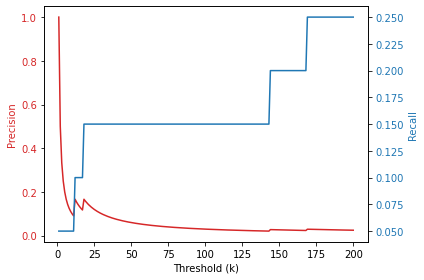

Graph for document 1


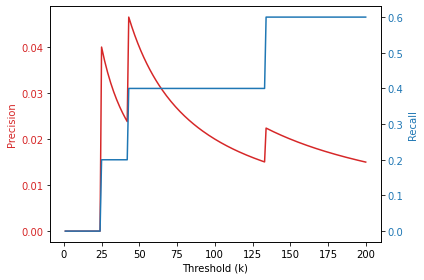

Graph for document 2


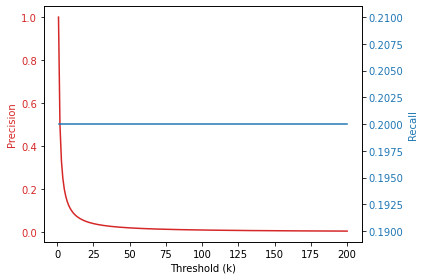

Graph for document 3


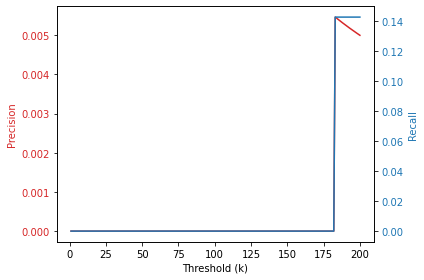

Graph for document 4


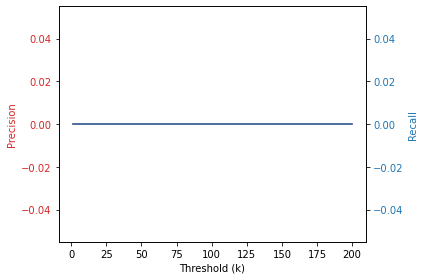

Graph for document 5


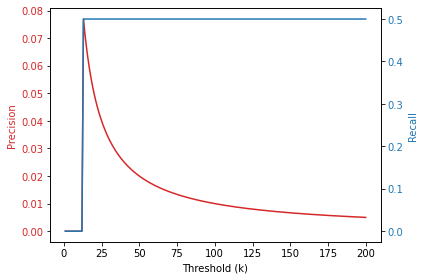

Graph for document 6


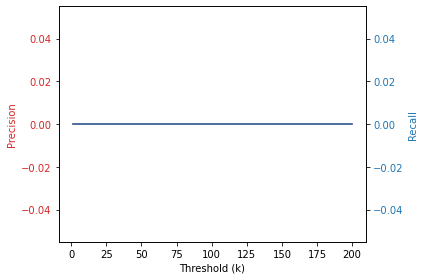

Graph for document 7


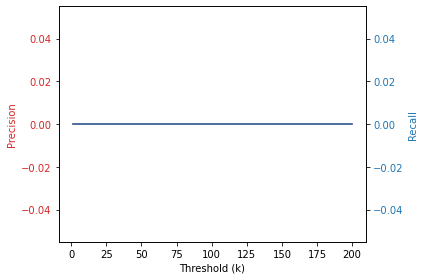

Graph for document 8


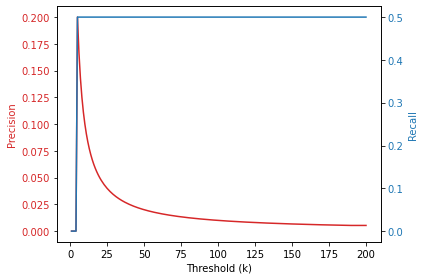

Graph for document 9


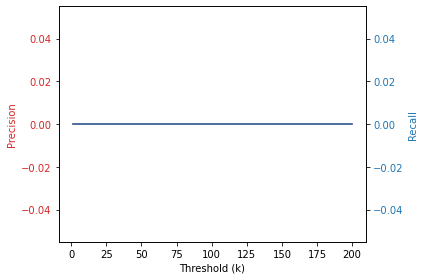

Graph for document 10


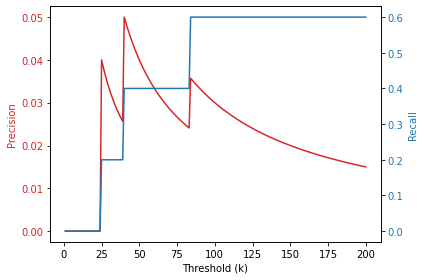

Graph for document 11


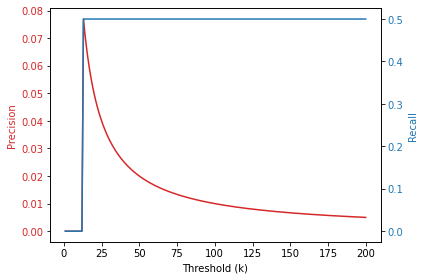

Graph for document 12


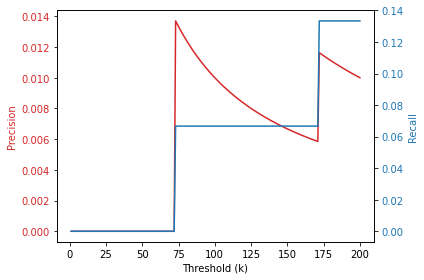

Graph for document 13


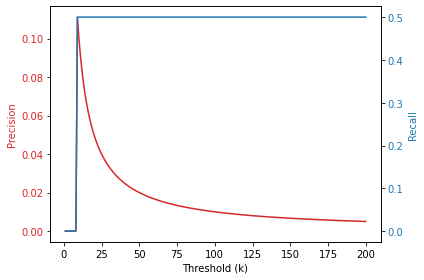

Graph for document 14


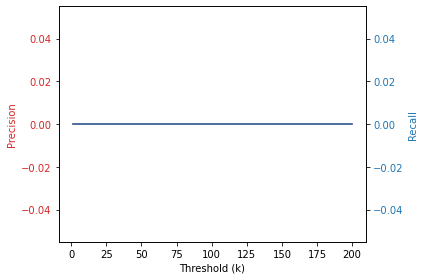

Graph for document 15


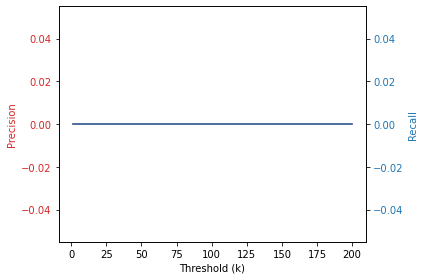

Graph for document 16


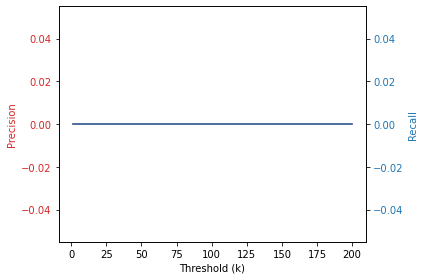

Graph for document 17


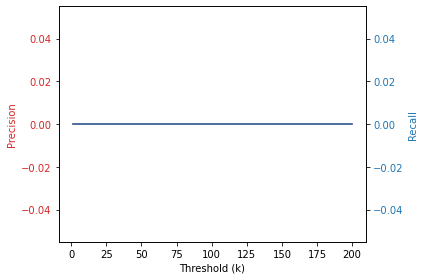

Graph for document 18


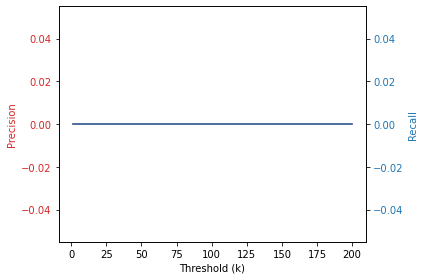

In [130]:
from matplotlib import pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages


for i in range(len(precison_values)):
        print("Graph for document "+ str(i))
    
        # Create some mock data
        t = [x for x in range(1,201)]
        data1 = precison_values[i]
        data2 = recall_values[i]

        fig, ax1 = plt.subplots()

        color = 'tab:red'
        ax1.set_xlabel('Threshold (k)')
        ax1.set_ylabel('Precision', color=color)
        ax1.plot(t, data1, color=color)
        ax1.tick_params(axis='y', labelcolor=color)

        ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

        color = 'tab:blue'
        ax2.set_ylabel('Recall', color=color)  # we already handled the x-label with ax1
        ax2.plot(t, data2, color=color)
        ax2.tick_params(axis='y', labelcolor=color)

        fig.tight_layout()  # otherwise the right y-label is slightly clipped
#         plt.savefig(str(i) + 'Document.png',  dpi=200)  #to save the plots
        plt.show()
      

 within the top 200 keywords , this scenario(considering only Noun) capture the keyword 'studiensituation', that is why we see the different trend in the graph for few documents compared to Noun+adjectives, we can also say that in our corpus(for that document) we have less number of adjectives.

Recall Score Graph for Documents 0


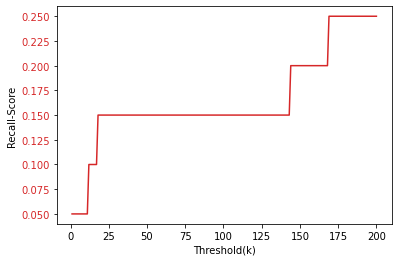

Recall Score Graph for Documents 1


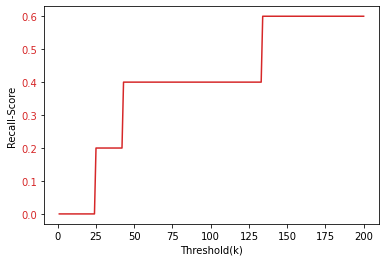

Recall Score Graph for Documents 2


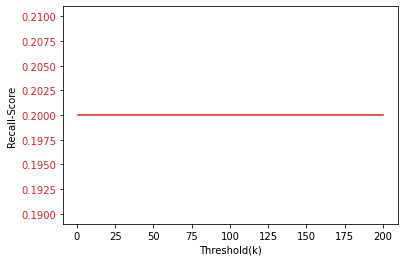

Recall Score Graph for Documents 3


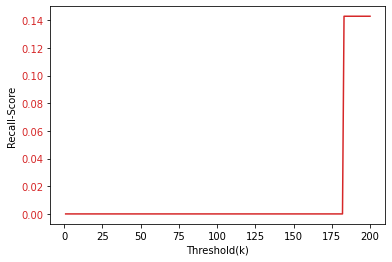

Recall Score Graph for Documents 4


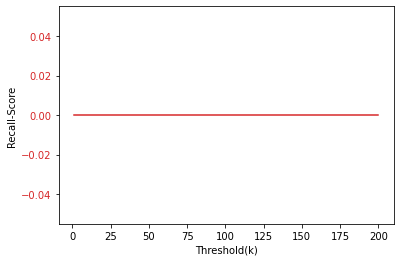

Recall Score Graph for Documents 5


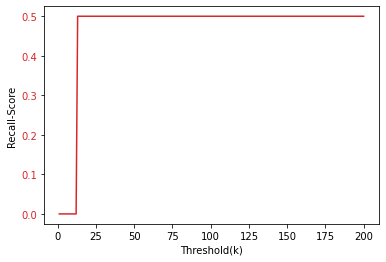

Recall Score Graph for Documents 6


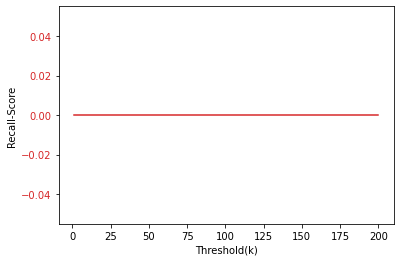

Recall Score Graph for Documents 7


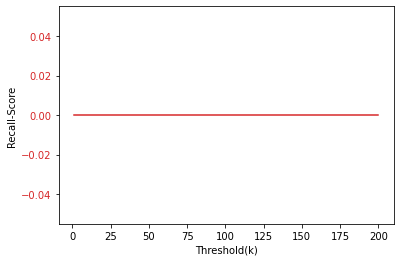

Recall Score Graph for Documents 8


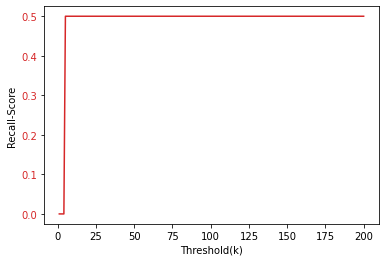

Recall Score Graph for Documents 9


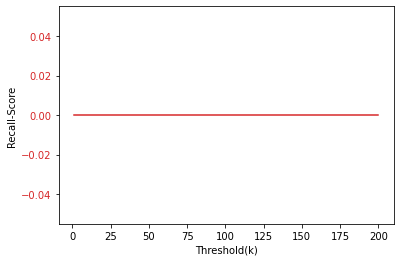

Recall Score Graph for Documents 10


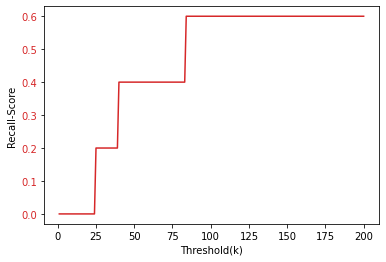

Recall Score Graph for Documents 11


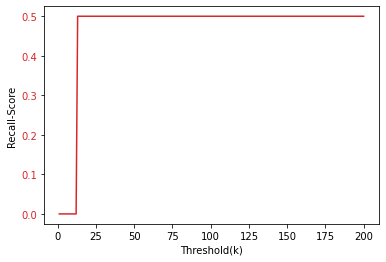

Recall Score Graph for Documents 12


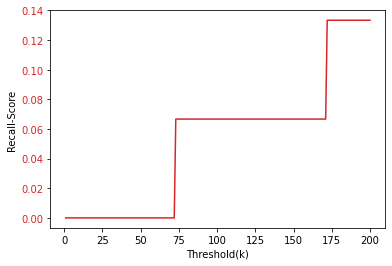

Recall Score Graph for Documents 13


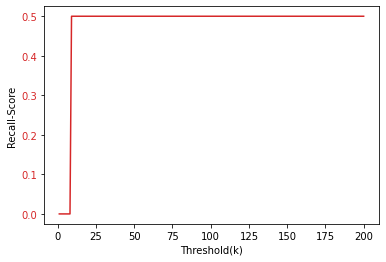

Recall Score Graph for Documents 14


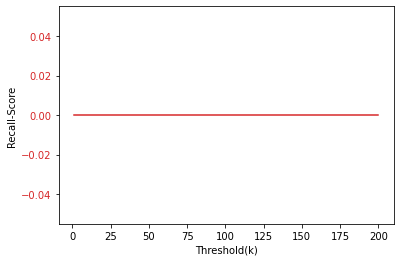

Recall Score Graph for Documents 15


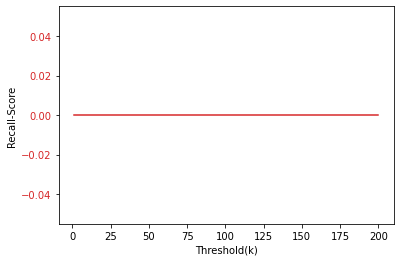

Recall Score Graph for Documents 16


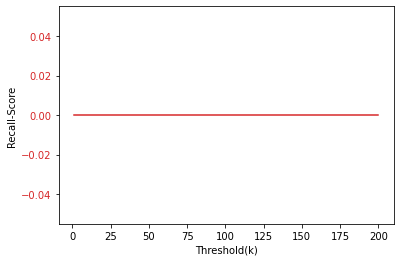

Recall Score Graph for Documents 17


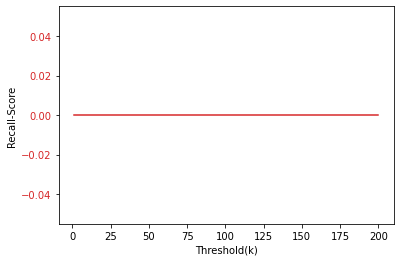

Recall Score Graph for Documents 18


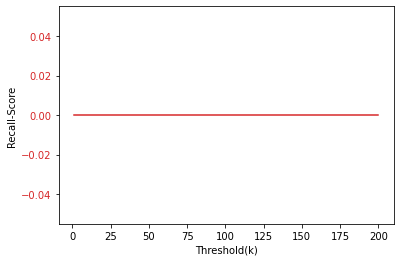

In [131]:
import matplotlib.pyplot as plt

for i in range(len(recall_values)):
    print("Recall Score Graph for Documents " + str(i))
    t = [x for x in range(1,201)]
    data = recall_values[i]
#     fig, ax1 = plt.subplots()

    color = 'tab:red'
    plt.xlabel("Threshold(k)")
    plt.ylabel("Recall-Score")
    plt.plot(t, data, color=color)
    plt.tick_params(axis='y', labelcolor=color)
    plt.show()
    


In [132]:
list(final['top_keywords'][0].values())

[0.498,
 0.286,
 0.151,
 0.147,
 0.129,
 0.119,
 0.117,
 0.116,
 0.114,
 0.111,
 0.109,
 0.109,
 0.109,
 0.102,
 0.102,
 0.102,
 0.098,
 0.097,
 0.093,
 0.093,
 0.09,
 0.09,
 0.089,
 0.089,
 0.087,
 0.086,
 0.082,
 0.08,
 0.079,
 0.079,
 0.079,
 0.079,
 0.073,
 0.071,
 0.07,
 0.07,
 0.069,
 0.069,
 0.069,
 0.069,
 0.069,
 0.068,
 0.068,
 0.068,
 0.068,
 0.065,
 0.064,
 0.064,
 0.06,
 0.06,
 0.06,
 0.06,
 0.059,
 0.057,
 0.057,
 0.056,
 0.056,
 0.056,
 0.056,
 0.056,
 0.054,
 0.054,
 0.054,
 0.054,
 0.054,
 0.054,
 0.053,
 0.052,
 0.051,
 0.05,
 0.05,
 0.049,
 0.049,
 0.049,
 0.049,
 0.049,
 0.048,
 0.045,
 0.045,
 0.045,
 0.045,
 0.045,
 0.045,
 0.045,
 0.044,
 0.044,
 0.044,
 0.043,
 0.042,
 0.042,
 0.042,
 0.041,
 0.041,
 0.04,
 0.04,
 0.04,
 0.039,
 0.039,
 0.037,
 0.037,
 0.037,
 0.036,
 0.036,
 0.036,
 0.035,
 0.035,
 0.035,
 0.035,
 0.034,
 0.034,
 0.034,
 0.034,
 0.034,
 0.034,
 0.034,
 0.034,
 0.034,
 0.034,
 0.033,
 0.033,
 0.033,
 0.033,
 0.033,
 0.033,
 0.033,
 0.032,
 0.031

In [133]:
# for every document : finding the location of best Recall values for first 15 document(top k for each doc)
# we are working on Recall because for DZHW , Recall is important

# Recall_Scores= recall_values[0:15]   #extracting Recall values of first 15 document(because we are also training on first 15 documents)

best_recall_indices = []
for i in range(len(recall_values)):
    best_recall_indices.append(recall_values[i].index(max(recall_values[i]))) #gives location for best recall_values for each documents

In [134]:
best_recall_indices # will give us index of best recall_values for each docuemnts, for example: for document 0, at index 168 we have the best recall value(check below for that particular value)

[168, 133, 0, 182, 0, 12, 0, 0, 4, 0, 83, 12, 171, 8, 0, 0, 0, 0, 0]

In [135]:
best_recall_indices_element = []

for i in range(len(best_recall_indices)):
    Recall_values = recall_values[i]
    best_recall_indices_element.append(Recall_values[best_recall_indices[i]])

In [136]:
best_recall_indices_element

[0.25,
 0.6,
 0.2,
 0.14285714285714285,
 0.0,
 0.5,
 0.0,
 0.0,
 0.5,
 0.0,
 0.6,
 0.5,
 0.13333333333333333,
 0.5,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [137]:
recall_values[12][181]

0.13333333333333333

In [138]:
# for best Recall_score location, find tf-idf extracted keyword score(TF-IDF value) corresponding to it, extract for every document value at best location
Recall_score_tf_idf = []
for i in range(len(best_recall_indices)):
    tf_idf_values = list(final['top_keywords'][i].values())
    Recall_score_tf_idf.append(tf_idf_values[best_recall_indices[i]])
    

In [139]:
Recall_score_tf_idf

[0.023,
 0.018,
 0.609,
 0.035,
 0.342,
 0.132,
 0.554,
 0.27,
 0.267,
 0.342,
 0.024,
 0.138,
 0.027,
 0.181,
 0.413,
 0.608,
 0.271,
 0.568,
 0.32]

In [140]:
min(Recall_score_tf_idf)

0.018

In [141]:
#average value of  recall_score_tf_idf
avearge_recall_score_tf_idf = sum(Recall_score_tf_idf)/len(Recall_score_tf_idf)
print("The average is ", round(avearge_recall_score_tf_idf,2))

The average is  0.27


In [142]:
avearge_recall_score_tf_idf

0.27063157894736845

In [143]:
# # Mean value of  recall_score_tf_idf

# avearge_f1_score_tf_idf = sum(f1_score_tf_idf)/len(f1_score_tf_idf)
# print("The average is ", round(avearge_f1_score_tf_idf,2))

In [144]:
#Testing on last 4 documents  , test set

test_set = sample_data_w_lemma[15:20]

In [145]:
len(test_set)

4

In [146]:
# # basically we are splitting .fit and .fit_transform and implementing them separaely to see the difference in our training and testing set
# count matrix 
count_vector=cv.transform(test_set) 
# tf-idf scores 
tf_idf_vector_test = tfidf_transformer.transform(count_vector) #model.predict , same number of unique words as train set.

In [147]:
tf_idf_vector_test.todense()

matrix([[0.0256614 , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.02356884, 0.01308361, ..., 0.03925084, 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.01585572, 0.        , ..., 0.05281128, 0.        ,
         0.        ]])

In [148]:
tf_idf_vector_test

<4x3003 sparse matrix of type '<class 'numpy.float64'>'
	with 1424 stored elements in Compressed Sparse Row format>

In [149]:
list(get_keywords(tfidf_transformer, feature_names, test_set[0]).values())

[0.608,
 0.236,
 0.231,
 0.188,
 0.163,
 0.162,
 0.137,
 0.132,
 0.128,
 0.114,
 0.103,
 0.098,
 0.097,
 0.097,
 0.094,
 0.088,
 0.085,
 0.085,
 0.083,
 0.081,
 0.077,
 0.075,
 0.074,
 0.074,
 0.071,
 0.07,
 0.07,
 0.067,
 0.065,
 0.065,
 0.065,
 0.065,
 0.065,
 0.065,
 0.065,
 0.065,
 0.063,
 0.06,
 0.057,
 0.057,
 0.057,
 0.057,
 0.057,
 0.057,
 0.057,
 0.057,
 0.053,
 0.053,
 0.053,
 0.051,
 0.051,
 0.051,
 0.051,
 0.051,
 0.05,
 0.047,
 0.047,
 0.047,
 0.047,
 0.045,
 0.045,
 0.043,
 0.043,
 0.043,
 0.043,
 0.04,
 0.04,
 0.04,
 0.04,
 0.036,
 0.035,
 0.035,
 0.035,
 0.035,
 0.033,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.032,
 0.031,
 0.031,
 0.031,
 0.03,
 0.03,
 0

In [150]:
result = []
for doc in test_set:
    df = {}
    df['Text'] = doc
    df['top_keywords'] = get_keywords(tfidf_transformer, feature_names, doc)
    result.append(df)
    
final2 = pd.DataFrame(result)
final2

,Text,top_keywords
0,Promotion Veröffentlichung Zeit Ja Nein Stadiu...,"{'promotion': 0.608, 'lehre': 0.236, 'disserta..."
1,Sommersemester BAföG Antrag Antrag Antrag Wide...,"{'studium': 0.271, 'tätigkeit': 0.26, 'lehramt..."
2,Frage Person Arbeits Lebensziel Hinsicht Überd...,"{'wohnung': 0.568, 'arbeitsstelle': 0.286, 'zw..."
3,Studium Präsenzstudium Fernstudium Studium Prä...,"{'fach': 0.32, 'studium': 0.185, 'sprach': 0.1..."


In [151]:
final2['Text'][2]

'Frage Person Arbeits Lebensziel Hinsicht Überdurchschnittliches Leistungsvermögen Funktion Anerkennung Beruf Mensch Familie Leben Tätigkeit Arbeitsbedingung Genug Zeit Interesse Arbeitsplatz Beruf Familie Aussage Vertrauen Gute Mensch Faulheit Stress Ruhe Interesse Aufgabe Vorstellungskraft Folgend Hauptwohnort Aussage Zeit Stadt Stadt Zeit Ausland Ausland Umzug Stadt Aussage Umzug Stadt Möglichkeit Mensch Umzug Stadt Kontakt Freund Umzug Stadt Kontakt Familie Stadt Karrieremöglichkeiten Stadt Freizeitmöglichkeit Wohnort Umzug Ausland Aussage Umzug Ausland Möglichkeit Mensch Umzug Ausland Kontakt Freund Umzug Ausland Kontakt Familie Ausland Karrieremöglichkeiten Land Freizeitmöglichkeit Aussage Weile Ausland Karriere Zeit Stadt Arbeitsstelle Beziehung Leben Ort Wohnsituation Folgend Angabe Wohnung Studienabschlusses Eltern Partner Kind Pflegekind Person Wohnung Hauptwohnung Zweitwohnung Wohnung Denken Zweit Nebenwohnung Wohnung Ende Studium Eltern Partner Kind Pflegekind Person Hauptw

In [152]:
tuple_values= final2['top_keywords'][1].items()

In [153]:
tuple_values

dict_items([('studium', 0.271), ('tätigkeit', 0.26), ('lehramt', 0.259), ('hochschulort', 0.254), ('ausgabe', 0.247), ('hochschule', 0.157), ('staatsangehörigkeit', 0.155), ('mensa', 0.153), ('eltern', 0.149), ('beeinträchtigung', 0.14), ('sommersemester', 0.119), ('studiengebühr', 0.119), ('durchschnittsbetrag', 0.105), ('kind', 0.1), ('abschluss', 0.095), ('nähe', 0.093), ('antrag', 0.089), ('studiengang', 0.084), ('studienberechtigung', 0.083), ('lebensmittel', 0.082), ('krankenversicherung', 0.082), ('stiftung', 0.08), ('mahlzeit', 0.079), ('aushilfstätigkeit', 0.079), ('grund', 0.075), ('sose', 0.075), ('hilfskraft', 0.073), ('sommersemesters', 0.071), ('miete', 0.071), ('kleidung', 0.071), ('geld', 0.067), ('semesterticket', 0.065), ('restaurant', 0.065), ('name', 0.065), ('kneipe', 0.065), ('klasse', 0.065), ('ausbildungsbetrieb', 0.065), ('sport', 0.065), ('erkrankung', 0.065), ('auslandsaufenthalts', 0.065), ('krankheit', 0.061), ('beitrag', 0.061), ('verzicht', 0.06), ('strea

In [154]:
#taking minimum of recall to extract keywords for the unseen document

Keywords_filter = []
for key, value in tuple_values:
    if value >= min(Recall_score_tf_idf):
        Keywords_filter.append(key)
        

In [155]:
Keywords_filter

['studium',
 'tätigkeit',
 'lehramt',
 'hochschulort',
 'ausgabe',
 'hochschule',
 'staatsangehörigkeit',
 'mensa',
 'eltern',
 'beeinträchtigung',
 'sommersemester',
 'studiengebühr',
 'durchschnittsbetrag',
 'kind',
 'abschluss',
 'nähe',
 'antrag',
 'studiengang',
 'studienberechtigung',
 'lebensmittel',
 'krankenversicherung',
 'stiftung',
 'mahlzeit',
 'aushilfstätigkeit',
 'grund',
 'sose',
 'hilfskraft',
 'sommersemesters',
 'miete',
 'kleidung',
 'geld',
 'semesterticket',
 'restaurant',
 'name',
 'kneipe',
 'klasse',
 'ausbildungsbetrieb',
 'sport',
 'erkrankung',
 'auslandsaufenthalts',
 'krankheit',
 'beitrag',
 'verzicht',
 'streaming',
 'schreibware',
 'rundfunkbeitrag',
 'kosten',
 'einbürgerung',
 'ausbildungsstätte',
 'verkehrsmittel',
 'pflegeversicherung',
 'instrument',
 'ernährung',
 'computer',
 'auto',
 'finanzierung',
 'fach',
 'hochschulreife',
 'behinderung',
 'bachelor',
 'video',
 'problem',
 'versicherungsbeitrag',
 'kraftstoff',
 'kopie',
 'getränk',
 'geld

In [156]:
len(Keywords_filter)

200

In [157]:
#taking average of recall to extract keywords for the unseen document

Keywords_filter1 = []
for key, value in tuple_values:
    if value >= avearge_recall_score_tf_idf:
        Keywords_filter1.append(key)
        

In [158]:
Keywords_filter1

['studium']

In [160]:
#mapping candidate keywords with thesaurus 
thesaurus_data = pd.read_csv("Thesaurus.csv")

In [161]:
thesaurus_data

,key,value
0,1. Weltkrieg,Erster Weltkrieg
1,11. Jahrhundert,9999
2,11. September 2001,Attentat
3,11. September 2001,USA
4,11. September 2001,Terrorismus
...,...,...
14340,Übersiedler,9999
14341,Überstunden,9999
14342,Übertragung,9999
14343,Überwachung,9999


In [162]:
thesaurus_list=thesaurus_data.values.tolist()

In [163]:
thesaurus_list

[['1. Weltkrieg ', ' Erster Weltkrieg'],
 ['11. Jahrhundert', '9999'],
 ['11. September 2001 ', ' Attentat'],
 ['11. September 2001 ', ' USA'],
 ['11. September 2001 ', ' Terrorismus'],
 ['12. Jahrhundert', '9999'],
 ['13. Jahrhundert', '9999'],
 ['14. Jahrhundert', '9999'],
 ['15. Jahrhundert', '9999'],
 ['16. Jahrhundert', '9999'],
 ['17. Jahrhundert', '9999'],
 ['18. Jahrhundert', '9999'],
 ['19. Jahrhundert', '9999'],
 ['2. Weltkrieg ', ' Zweiter Weltkrieg'],
 ['20. Jahrhundert', '9999'],
 ['21. Jahrhundert', '9999'],
 ['68er-Bewegung ', ' Studentenbewegung'],
 ['Abbrecher', '9999'],
 ['Abduktion', '9999'],
 ['Abendroth, Wolfgang', '9999'],
 ['Abendschule', '9999'],
 ['Abenteuerfilm', '9999'],
 ['Abenteuerpädagogik ', ' Erlebnispädagogik'],
 ['Aberglaube', '9999'],
 ['Abfall', '9999'],
 ['Abfallbeseitigung', '9999'],
 ['Abfalltrennung', '9999'],
 ['Abfallverbrennung ', ' Abfallbeseitigung'],
 ['Abfallvermeidung', '9999'],
 ['Abfallverwertung', '9999'],
 ['Abfallwirtschaft', '9999']

In [164]:
#lowercase thesaurus words
new_thesaurus_list = []
for sublist in thesaurus_list:
    new_sublist = []
    for item in sublist:
        new_sublist.append(item.lower())
    new_thesaurus_list.append(new_sublist) 

In [165]:
new_thesaurus_list

[['1. weltkrieg ', ' erster weltkrieg'],
 ['11. jahrhundert', '9999'],
 ['11. september 2001 ', ' attentat'],
 ['11. september 2001 ', ' usa'],
 ['11. september 2001 ', ' terrorismus'],
 ['12. jahrhundert', '9999'],
 ['13. jahrhundert', '9999'],
 ['14. jahrhundert', '9999'],
 ['15. jahrhundert', '9999'],
 ['16. jahrhundert', '9999'],
 ['17. jahrhundert', '9999'],
 ['18. jahrhundert', '9999'],
 ['19. jahrhundert', '9999'],
 ['2. weltkrieg ', ' zweiter weltkrieg'],
 ['20. jahrhundert', '9999'],
 ['21. jahrhundert', '9999'],
 ['68er-bewegung ', ' studentenbewegung'],
 ['abbrecher', '9999'],
 ['abduktion', '9999'],
 ['abendroth, wolfgang', '9999'],
 ['abendschule', '9999'],
 ['abenteuerfilm', '9999'],
 ['abenteuerpädagogik ', ' erlebnispädagogik'],
 ['aberglaube', '9999'],
 ['abfall', '9999'],
 ['abfallbeseitigung', '9999'],
 ['abfalltrennung', '9999'],
 ['abfallverbrennung ', ' abfallbeseitigung'],
 ['abfallvermeidung', '9999'],
 ['abfallverwertung', '9999'],
 ['abfallwirtschaft', '9999']

In [166]:
#mapping keyword from tfidf with thesaurus 

keywords_after_bruteforce_mapping=[]
for i in range(len(final)):
    keywords_after_bruteforce_mapping.append([])
    for elem in list((final['top_keywords'])[i].keys()):
        temp = [tuple((index1,index2))for index1,value1 in enumerate(new_thesaurus_list) for index2,value2 in enumerate(value1) if value2==elem]
        if (len(temp))!=0:
            for elem1 in temp:
                if elem1[1]==0:
                    if new_thesaurus_list[elem1[0]][1] == '9999':
                        keywords_after_bruteforce_mapping[i].append(elem)
                    else:
                        keywords_after_bruteforce_mapping[i].append(tuple((elem,new_thesaurus_list[elem1[0]][1])))
                        
                elif elem1[1]==1:
                    keywords_after_bruteforce_mapping[i].append(elem)
                    

In [167]:
#can you add tf-idf importance?
keywords_after_bruteforce_mapping

[['promotion',
  'hochschule',
  'vertrag',
  'aussage',
  'beratung',
  'betreuung',
  'wissenschaft',
  'mitgliedschaft',
  'entscheidungsprozess',
  'unternehmen',
  'forschungseinrichtung',
  'tätigkeit',
  'arbeitsvertrag',
  'inhalt',
  'praxis',
  'eltern',
  'zufriedenheit',
  'arbeit',
  'stiftung',
  'programm',
  'karriere',
  'behörde',
  'informationsquelle',
  'universität',
  'staatsangehörigkeit',
  'interesse',
  'schreiben',
  'beschäftigung',
  'kind',
  'verhalten',
  'forschungsprojekt',
  'kontakt',
  'karriereplanung',
  'beruf',
  'angebot',
  'organisation',
  'stipendium',
  'projekt',
  'konflikt',
  'forschung',
  'entwicklung',
  'entscheidungsfindung',
  'institution',
  'behinderung',
  'befragung',
  'kleinkind',
  'kompetenz',
  'team',
  'statistik',
  'hochschullehrer',
  'erwerbstätigkeit',
  'antrag',
  'lehrveranstaltung',
  'familie',
  'wissenschaftler',
  'verfahren',
  'messe',
  'frau',
  'information',
  'fachhochschule',
  'finanzierung',
  

In [168]:
final['Keywords_after_mapping'] = keywords_after_bruteforce_mapping

In [169]:
final

,Text,top_keywords,Valid_Ground_Truth,Ground_Truth,Keywords_after_mapping
0,Hinweis Datenschutz Link Hochschule Dezember P...,"{'promotion': 0.498, 'betreuer': 0.286, 'hochs...","wissenschaftssystem, betreuung, wissenschaftli...","wissenschaftssystem, betreuung, wissenschaft...","[promotion, hochschule, vertrag, aussage, bera..."
1,Information Datenschutz Willige Teilnahme Befr...,"{'kurs': 0.444, 'deutsch': 0.415, 'vorbereitun...","geflüchtete, studienkolleg, studienvorbereitung","integration, geflüchtete, studienkolleg, mi...","[sprache, studiengang, aussage, text, hochschu..."
2,Studium Sommersemester Wintersemester Merkmal ...,"{'masterstudium': 0.609, 'studium': 0.327, 'ma...",masterstudium,"beruflicher verbleib von exmatrikulierten, st...","[studium, studienfach, studienanforderung, hoc..."
3,Art Hochschule Universität Universität Fachhoc...,"{'fach': 0.3, 'studium': 0.231, 'sprache': 0.1...","evaluation, qualifikation, studiensituation","evaluation, qualifikation, effizienz, studi...","[studium, sprache, kulturwissenschaft, musik, ..."
4,Tätigkeit Trainee Beschäftigung Praktikum Refe...,"{'tätigkeit': 0.342, 'weiterbildung': 0.311, '...",,hochschulforschung,"[tätigkeit, weiterbildung, arbeitgeber, betrie..."
5,Ware Befragung Form Abschluss Promotion Form E...,"{'tätigkeit': 0.392, 'dienst': 0.292, 'rätin':...",promotion,"promotion, hochschulforschung","[tätigkeit, angestellter, personal, leistung, ..."
6,Teilnahme Befragung Verwendung Datum Bildungs ...,"{'studium': 0.554, 'bereich': 0.215, 'ausbildu...",,"studienberechtigte, hochschulforschung","[studium, ausbildung, berufsaussicht, schule, ..."
7,Sprache Befragung Information Datennutzung Ein...,"{'kollege': 0.27, 'wissenschaftlerinnen': 0.21...",,hochschulforschung,"[antrag, wissenschaftler, forschung, gutachten..."
8,Teilnahme Befragung Verwendung Datum Ware Befr...,"{'ausland': 0.333, 'tätigkeit': 0.301, 'stelle...",promotion,"promotion, hochschulforschung","[ausland, tätigkeit, weiterbildung, promotion,..."
9,Hauptfach Fach Sommersemester Fach Angabe Filt...,"{'auslandsaufenthalt': 0.342, 'tätigkeit': 0.2...",,hochschulforschung,"[tätigkeit, lehramt, studium, eltern, programm..."


In [170]:
final['top_keywords'][0]

{'promotion': 0.498,
 'betreuer': 0.286,
 'hochschule': 0.151,
 'betreuende': 0.147,
 'fakultät': 0.129,
 'vertrag': 0.119,
 'stelle': 0.117,
 'promotionsprogramm': 0.116,
 'thema': 0.114,
 'aussage': 0.111,
 'beratung': 0.109,
 'promovierende': 0.109,
 'sonstige': 0.109,
 'selbstständigkeit': 0.102,
 'promotionsverfahren': 0.102,
 'promotionsprojekt': 0.102,
 'forschungs': 0.098,
 'betreuung': 0.097,
 'person': 0.093,
 'wissenschaft': 0.093,
 'mitgliedschaft': 0.09,
 'entscheidungsprozess': 0.09,
 'verfassen': 0.089,
 'hauptbetreuer': 0.089,
 'bezug': 0.087,
 'bereich': 0.086,
 'unternehmen': 0.082,
 'forschungseinrichtung': 0.08,
 'tätigkeit': 0.079,
 'kulturinstitution': 0.079,
 'karriereentwicklung': 0.079,
 'graduiertenakademie': 0.079,
 'arbeitsvertrag': 0.073,
 'forschungsinstitut': 0.071,
 'kurs': 0.07,
 'inhalt': 0.07,
 'hauptbetreuerin': 0.069,
 'betreuungsvereinbarung': 0.069,
 'beratungs': 0.069,
 'praxis': 0.069,
 'eltern': 0.069,
 'zufriedenheit': 0.068,
 'qualifizierungs

In [171]:
len(final['top_keywords'][0])

200

In [172]:
final['Keywords_after_mapping'][0]

['promotion',
 'hochschule',
 'vertrag',
 'aussage',
 'beratung',
 'betreuung',
 'wissenschaft',
 'mitgliedschaft',
 'entscheidungsprozess',
 'unternehmen',
 'forschungseinrichtung',
 'tätigkeit',
 'arbeitsvertrag',
 'inhalt',
 'praxis',
 'eltern',
 'zufriedenheit',
 'arbeit',
 'stiftung',
 'programm',
 'karriere',
 'behörde',
 'informationsquelle',
 'universität',
 'staatsangehörigkeit',
 'interesse',
 'schreiben',
 'beschäftigung',
 'kind',
 'verhalten',
 'forschungsprojekt',
 'kontakt',
 'karriereplanung',
 'beruf',
 'angebot',
 'organisation',
 'stipendium',
 'projekt',
 'konflikt',
 'forschung',
 'entwicklung',
 'entscheidungsfindung',
 'institution',
 'behinderung',
 'befragung',
 'kleinkind',
 'kompetenz',
 'team',
 'statistik',
 'hochschullehrer',
 'erwerbstätigkeit',
 'antrag',
 'lehrveranstaltung',
 'familie',
 'wissenschaftler',
 'verfahren',
 'messe',
 'frau',
 'information',
 'fachhochschule',
 'finanzierung',
 'kinderwunsch',
 'problem',
 'text',
 'konferenz',
 'förderung

In [173]:
len(final['Keywords_after_mapping'][0])

79

In [174]:
# optimization.
stripped_new_thesaurus_list=[]
for i in range(len(new_thesaurus_list)):
        stripped_new_thesaurus_list.append([s.strip() for s in new_thesaurus_list[i]])

In [175]:
stripped_new_thesaurus_list

[['1. weltkrieg', 'erster weltkrieg'],
 ['11. jahrhundert', '9999'],
 ['11. september 2001', 'attentat'],
 ['11. september 2001', 'usa'],
 ['11. september 2001', 'terrorismus'],
 ['12. jahrhundert', '9999'],
 ['13. jahrhundert', '9999'],
 ['14. jahrhundert', '9999'],
 ['15. jahrhundert', '9999'],
 ['16. jahrhundert', '9999'],
 ['17. jahrhundert', '9999'],
 ['18. jahrhundert', '9999'],
 ['19. jahrhundert', '9999'],
 ['2. weltkrieg', 'zweiter weltkrieg'],
 ['20. jahrhundert', '9999'],
 ['21. jahrhundert', '9999'],
 ['68er-bewegung', 'studentenbewegung'],
 ['abbrecher', '9999'],
 ['abduktion', '9999'],
 ['abendroth, wolfgang', '9999'],
 ['abendschule', '9999'],
 ['abenteuerfilm', '9999'],
 ['abenteuerpädagogik', 'erlebnispädagogik'],
 ['aberglaube', '9999'],
 ['abfall', '9999'],
 ['abfallbeseitigung', '9999'],
 ['abfalltrennung', '9999'],
 ['abfallverbrennung', 'abfallbeseitigung'],
 ['abfallvermeidung', '9999'],
 ['abfallverwertung', '9999'],
 ['abfallwirtschaft', '9999'],
 ['abfindung',

In [176]:
#mapping keyword from tfidf with thesaurus 

keywords_after_optimization=[]
for i in range(len(final)):
    keywords_after_optimization.append([])
    for elem in list((final['top_keywords'])[i].items()):
        temp = [tuple((index1,index2))for index1,value1 in enumerate(new_thesaurus_list) for index2,value2 in enumerate(value1) if value2==elem[0]]
        if (len(temp))!=0:
            for elem1 in temp:
                if elem1[1]==0:
                    if new_thesaurus_list[elem1[0]][1] == '9999':
                        keywords_after_optimization[i].append((elem[0],elem[1]+1))
                    else:
                        keywords_after_optimization[i].append(tuple(((elem[0],elem[1]+1),(new_thesaurus_list[elem1[0]][1],1))))
                        
                elif elem1[1]==1:
                    keywords_after_optimization[i].append((elem[0],elem[1]+1))
        else:
            keywords_after_optimization[i].append((elem[0],elem[1]))

In [177]:
keywords_after_optimization[0]

[('promotion', 1.498),
 ('betreuer', 0.286),
 ('hochschule', 1.151),
 ('betreuende', 0.147),
 ('fakultät', 0.129),
 ('vertrag', 1.119),
 ('stelle', 0.117),
 ('promotionsprogramm', 0.116),
 ('thema', 0.114),
 ('aussage', 1.111),
 ('beratung', 1.109),
 ('promovierende', 0.109),
 ('sonstige', 0.109),
 ('selbstständigkeit', 0.102),
 ('promotionsverfahren', 0.102),
 ('promotionsprojekt', 0.102),
 ('forschungs', 0.098),
 ('betreuung', 1.097),
 ('person', 0.093),
 ('wissenschaft', 1.093),
 ('mitgliedschaft', 1.09),
 ('entscheidungsprozess', 1.09),
 ('verfassen', 0.089),
 ('hauptbetreuer', 0.089),
 ('bezug', 0.087),
 ('bereich', 0.086),
 ('unternehmen', 1.082),
 ('forschungseinrichtung', 1.08),
 ('tätigkeit', 1.079),
 ('kulturinstitution', 0.079),
 ('karriereentwicklung', 0.079),
 ('graduiertenakademie', 0.079),
 ('arbeitsvertrag', 1.073),
 ('forschungsinstitut', 0.071),
 ('kurs', 0.07),
 ('inhalt', 1.07),
 ('hauptbetreuerin', 0.069),
 ('betreuungsvereinbarung', 0.069),
 ('beratungs', 0.069),


In [178]:
keywords_after_optimization_sorted = []
for j in range(len(keywords_after_optimization)):
        keywords_after_optimization_sorted.append(sorted(keywords_after_optimization[j],key=lambda x:(-x[1],x[0])))

In [179]:
keywords_after_optimization_sorted[0]

[('promotion', 1.498),
 ('hochschule', 1.151),
 ('vertrag', 1.119),
 ('aussage', 1.111),
 ('beratung', 1.109),
 ('betreuung', 1.097),
 ('wissenschaft', 1.093),
 ('entscheidungsprozess', 1.09),
 ('mitgliedschaft', 1.09),
 ('unternehmen', 1.082),
 ('forschungseinrichtung', 1.08),
 ('tätigkeit', 1.079),
 ('arbeitsvertrag', 1.073),
 ('inhalt', 1.07),
 ('eltern', 1.069),
 ('praxis', 1.069),
 ('zufriedenheit', 1.068),
 ('arbeit', 1.064),
 ('karriere', 1.06),
 ('programm', 1.06),
 ('stiftung', 1.06),
 ('behörde', 1.057),
 ('informationsquelle', 1.056),
 ('interesse', 1.054),
 ('schreiben', 1.054),
 ('staatsangehörigkeit', 1.054),
 ('universität', 1.054),
 ('beschäftigung', 1.053),
 ('kind', 1.052),
 ('forschungsprojekt', 1.049),
 ('verhalten', 1.049),
 ('kontakt', 1.048),
 ('karriereplanung', 1.045),
 ('angebot', 1.044),
 ('beruf', 1.044),
 ('organisation', 1.042),
 ('stipendium', 1.042),
 ('projekt', 1.041),
 ('konflikt', 1.04),
 ('entwicklung', 1.039),
 ('forschung', 1.039),
 ('entscheidung

In [180]:
final['Ground_Truth']

0     wissenschaftssystem,  betreuung,  wissenschaft...
1     integration,  geflüchtete,  studienkolleg,  mi...
2     beruflicher verbleib von exmatrikulierten,  st...
3     evaluation,  qualifikation,  effizienz,  studi...
4                                    hochschulforschung
5                        promotion,  hochschulforschung
6               studienberechtigte,  hochschulforschung
7                                    hochschulforschung
8                        promotion,  hochschulforschung
9                                    hochschulforschung
10    integration,  geflüchtete,  studienkolleg,  mi...
11                       promotion,  hochschulforschung
12    internationale studierende,  digitale lehre,  ...
13                       promotion,  hochschulforschung
14                     absolventen,  hochschulforschung
15                                   hochschulforschung
16                                   hochschulforschung
17                                   hochschulfo

In [181]:
predicted_new=[]
chunk_size = 1 #coz max ground truth size is 20
for i in range(len(keywords_after_optimization_sorted)):
    predicted_new.append([])           #used for nested list
    for j in range(1,int(200/chunk_size)+1):
        predicted_new[i].append([elem[0] for elem in keywords_after_optimization_sorted[i]][0:j*chunk_size])

In [182]:
len(predicted_new[0])

200

In [183]:
len(final['Ground_Truth'])

19

In [184]:
gt_new = list(final['Ground_Truth'])

In [185]:
#final.to_csv("Questionnaire_check.csv")

In [186]:
ground_truth_new =[]
for i in range(len(gt_new)):
    ground_truth_new.append([gt_new[i]])

In [187]:
for i in range(len(ground_truth_new)):
    ground_truth_new[i]= ground_truth_new[i][0].split(",")

In [188]:
for i in range(len(ground_truth_new)):
    for j in range(len(ground_truth_new[i])):
        ground_truth_new[i][j] = ground_truth_new[i][j].strip()

In [189]:
ground_truth_new[12]

['internationale studierende',
 'digitale lehre',
 'wohnsituation',
 'finanzielle situation',
 'studienerfolg',
 'erwerbstätige studierende',
 'studierende mit kind',
 'persönlichkeit',
 'beeinträchtigt studierende',
 'studiensituation',
 'studierende',
 'corona',
 'gesundheit',
 'studierendenforschung',
 'hochschulforschung']

In [190]:
keywords_after_optimization_sorted[0]

[('promotion', 1.498),
 ('hochschule', 1.151),
 ('vertrag', 1.119),
 ('aussage', 1.111),
 ('beratung', 1.109),
 ('betreuung', 1.097),
 ('wissenschaft', 1.093),
 ('entscheidungsprozess', 1.09),
 ('mitgliedschaft', 1.09),
 ('unternehmen', 1.082),
 ('forschungseinrichtung', 1.08),
 ('tätigkeit', 1.079),
 ('arbeitsvertrag', 1.073),
 ('inhalt', 1.07),
 ('eltern', 1.069),
 ('praxis', 1.069),
 ('zufriedenheit', 1.068),
 ('arbeit', 1.064),
 ('karriere', 1.06),
 ('programm', 1.06),
 ('stiftung', 1.06),
 ('behörde', 1.057),
 ('informationsquelle', 1.056),
 ('interesse', 1.054),
 ('schreiben', 1.054),
 ('staatsangehörigkeit', 1.054),
 ('universität', 1.054),
 ('beschäftigung', 1.053),
 ('kind', 1.052),
 ('forschungsprojekt', 1.049),
 ('verhalten', 1.049),
 ('kontakt', 1.048),
 ('karriereplanung', 1.045),
 ('angebot', 1.044),
 ('beruf', 1.044),
 ('organisation', 1.042),
 ('stipendium', 1.042),
 ('projekt', 1.041),
 ('konflikt', 1.04),
 ('entwicklung', 1.039),
 ('forschung', 1.039),
 ('entscheidung

In [191]:
len(list(keywords_after_optimization_sorted))

19

In [192]:
######################################################
# function to evaluate success of keyword extraction #
######################################################
def evaluate_keywords_new(proposed,groundtruth):
  """
  Returns precision, recall, and f1 score for proposed keywords against ground truth
  """
  proposed_set = set(proposed)
  true_set = set(groundtruth)
  
  true_positives = len(proposed_set.intersection(true_set))
  if len(proposed_set)==0:
    precision = 0
  else:
    # note denominator reflects total number of words
    # not total number of unique words
    precision = true_positives/float(len(proposed)) 
      
  if len(true_set)==0:
    recall = 0
  else:
    recall = true_positives/float(len(true_set))
  
  if precision + recall > 0:
    f1 = 2*precision*recall/float(precision + recall)
  else:
    f1 = 0

  return (precision, recall, f1)

In [193]:
metric_values_new = []
for i in range(len(predicted_new)):
    metric_values_new.append([]) 
    for j in range(len(predicted_new[i])):
        metric_values_new[i].append(evaluate_keywords_new(predicted_new[i][j], ground_truth_new[i]))

In [194]:
len(metric_values_new[0])

200

In [195]:
precison_values_new = []

for i in range(len(metric_values_new)):
    precison_values_new.append([])
    for a_tuple in metric_values_new[i]:
        precison_values_new[i].append(a_tuple[0])

In [196]:
len(precison_values_new[0])

200

In [197]:
precison_values_new[0]

[1.0,
 0.5,
 0.3333333333333333,
 0.25,
 0.2,
 0.3333333333333333,
 0.2857142857142857,
 0.25,
 0.2222222222222222,
 0.2,
 0.18181818181818182,
 0.16666666666666666,
 0.15384615384615385,
 0.14285714285714285,
 0.13333333333333333,
 0.125,
 0.11764705882352941,
 0.1111111111111111,
 0.10526315789473684,
 0.1,
 0.09523809523809523,
 0.09090909090909091,
 0.08695652173913043,
 0.08333333333333333,
 0.08,
 0.07692307692307693,
 0.07407407407407407,
 0.07142857142857142,
 0.06896551724137931,
 0.06666666666666667,
 0.06451612903225806,
 0.0625,
 0.06060606060606061,
 0.058823529411764705,
 0.05714285714285714,
 0.05555555555555555,
 0.05405405405405406,
 0.05263157894736842,
 0.05128205128205128,
 0.05,
 0.04878048780487805,
 0.047619047619047616,
 0.046511627906976744,
 0.045454545454545456,
 0.044444444444444446,
 0.043478260869565216,
 0.0425531914893617,
 0.041666666666666664,
 0.04081632653061224,
 0.04,
 0.0392156862745098,
 0.038461538461538464,
 0.03773584905660377,
 0.037037037037

In [198]:
recall_values_new = []
for i in range(len(metric_values_new)):
    recall_values_new.append([])
    for a_tuple in metric_values_new[i]:
        recall_values_new[i].append(a_tuple[1])

In [199]:
recall_values_new[0]

[0.05,
 0.05,
 0.05,
 0.05,
 0.05,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.1,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.15,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.2,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,
 0.25,


In [200]:
f1_score_new = []
for i in range(len(metric_values_new)):
    f1_score_new.append([])
    for a_tuple in metric_values_new[i]:
        f1_score_new[i].append(a_tuple[2])

In [201]:
f1_score[0]

[0.09523809523809523,
 0.09090909090909091,
 0.08695652173913045,
 0.08333333333333334,
 0.08000000000000002,
 0.07692307692307691,
 0.07407407407407408,
 0.07142857142857144,
 0.06896551724137932,
 0.06666666666666667,
 0.06451612903225806,
 0.125,
 0.12121212121212123,
 0.11764705882352941,
 0.1142857142857143,
 0.11111111111111112,
 0.1081081081081081,
 0.15789473684210525,
 0.15384615384615385,
 0.15,
 0.14634146341463414,
 0.14285714285714282,
 0.13953488372093023,
 0.13636363636363635,
 0.1333333333333333,
 0.13043478260869565,
 0.12765957446808512,
 0.125,
 0.12244897959183673,
 0.12,
 0.11764705882352941,
 0.11538461538461538,
 0.11320754716981132,
 0.11111111111111112,
 0.10909090909090909,
 0.10714285714285714,
 0.10526315789473685,
 0.10344827586206896,
 0.1016949152542373,
 0.1,
 0.09836065573770492,
 0.09677419354838708,
 0.09523809523809525,
 0.09374999999999999,
 0.09230769230769231,
 0.09090909090909091,
 0.08955223880597013,
 0.08823529411764706,
 0.08695652173913043,


Graph for document 0


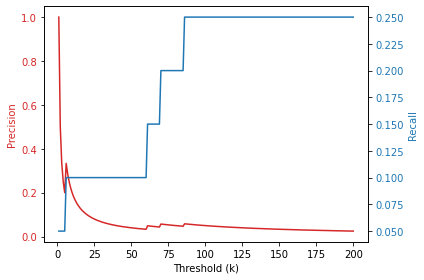

Graph for document 1


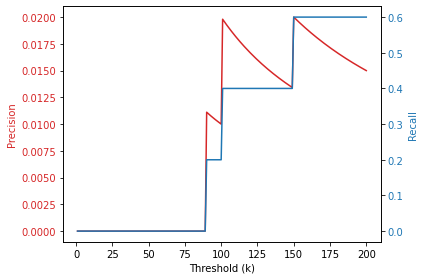

Graph for document 2


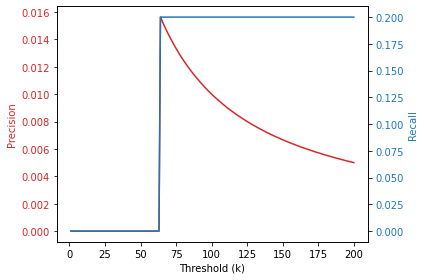

Graph for document 3


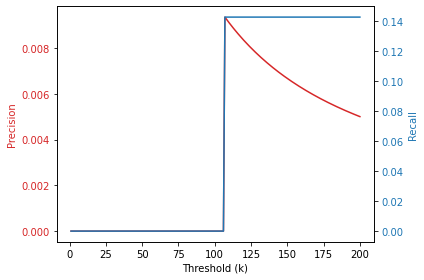

Graph for document 4


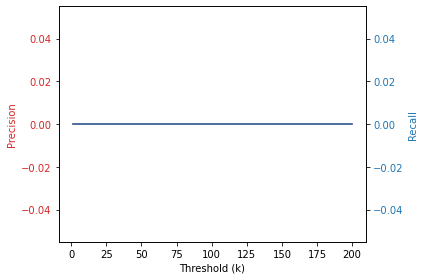

Graph for document 5


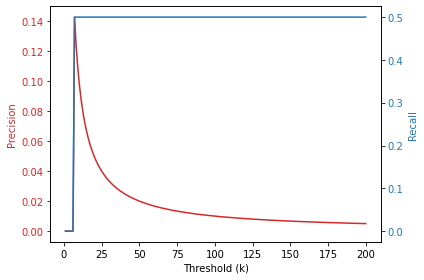

Graph for document 6


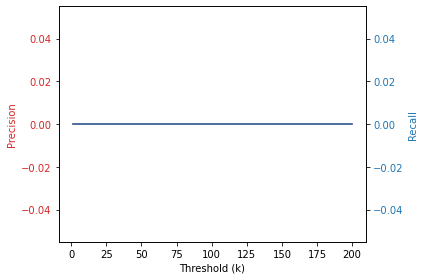

Graph for document 7


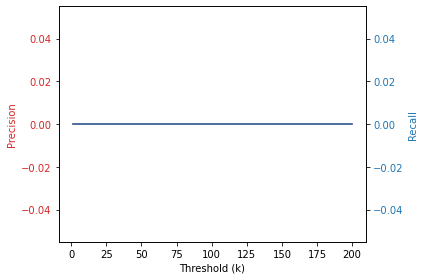

Graph for document 8


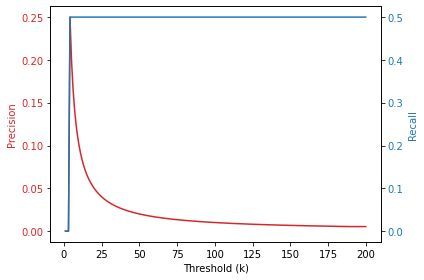

Graph for document 9


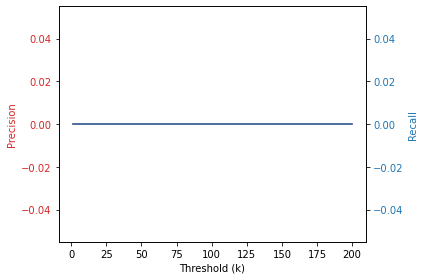

Graph for document 10


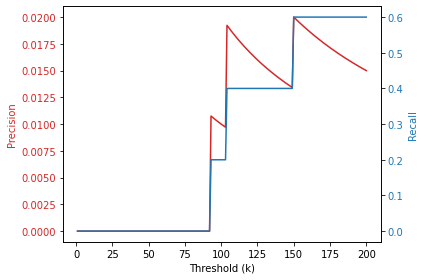

Graph for document 11


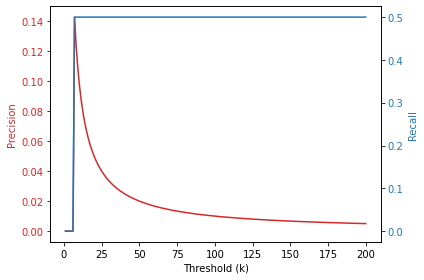

Graph for document 12


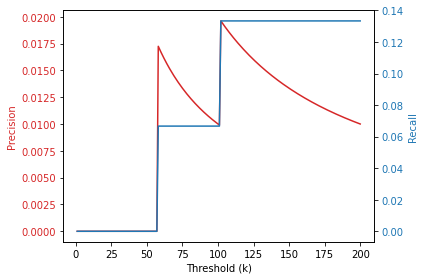

Graph for document 13


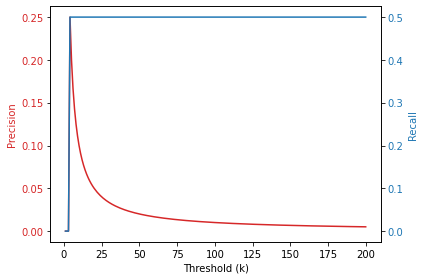

Graph for document 14


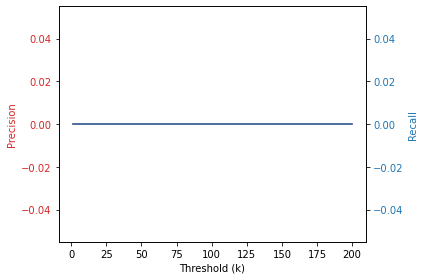

Graph for document 15


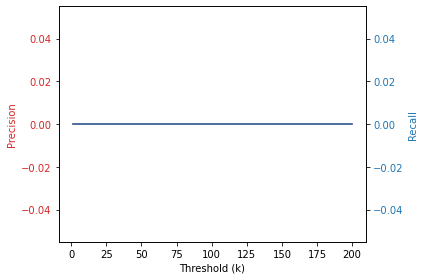

Graph for document 16


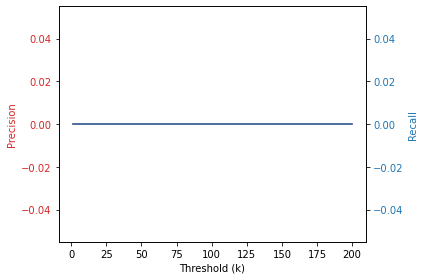

Graph for document 17


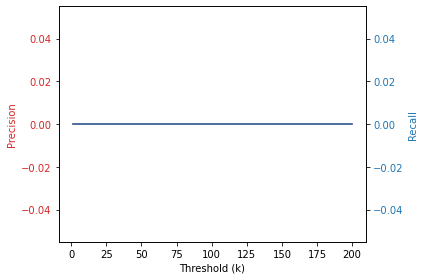

Graph for document 18


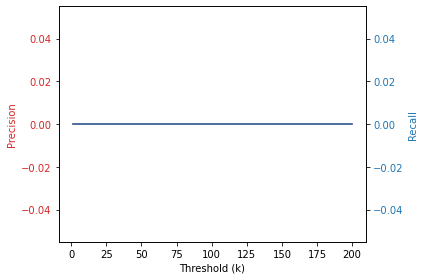

In [202]:
from matplotlib import pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages


for i in range(len(precison_values_new)):
        print("Graph for document "+ str(i))
    
        # Create some mock data
        t = [x for x in range(1,201)]
        data1 = precison_values_new[i]
        data2 = recall_values_new[i]

        fig, ax1 = plt.subplots()

        color = 'tab:red'
        ax1.set_xlabel('Threshold (k)')
        ax1.set_ylabel('Precision', color=color)
        ax1.plot(t, data1, color=color)
        ax1.tick_params(axis='y', labelcolor=color)

        ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

        color = 'tab:blue'
        ax2.set_ylabel('Recall', color=color)  # we already handled the x-label with ax1
        ax2.plot(t, data2, color=color)
        ax2.tick_params(axis='y', labelcolor=color)

        fig.tight_layout()  # otherwise the right y-label is slightly clipped
#         plt.savefig(str(i) + 'Document.png',  dpi=200)  #to save the plots
        plt.show()
      

Recall Score Graph for Documents 0


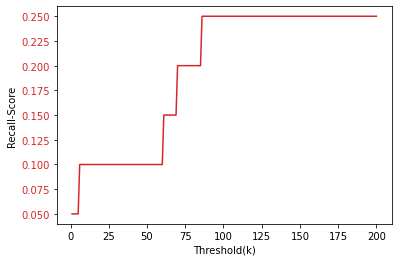

Recall Score Graph for Documents 1


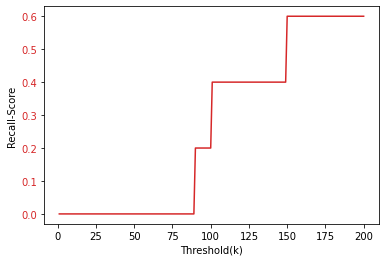

Recall Score Graph for Documents 2


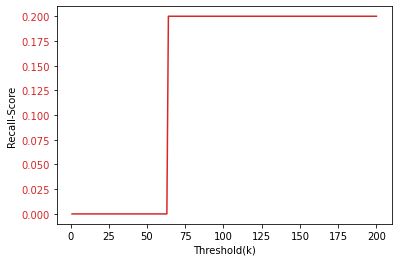

Recall Score Graph for Documents 3


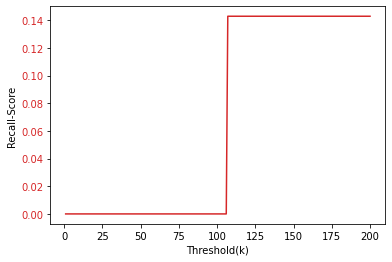

Recall Score Graph for Documents 4


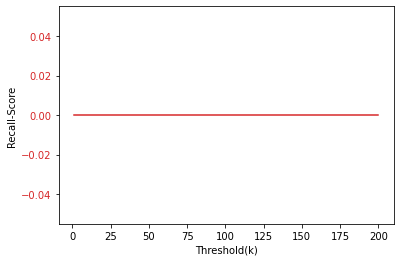

Recall Score Graph for Documents 5


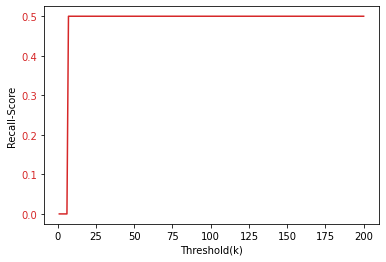

Recall Score Graph for Documents 6


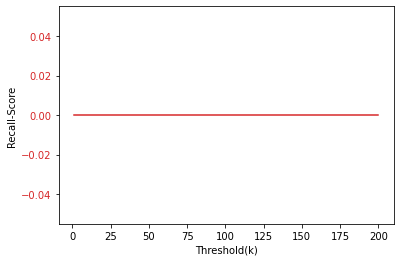

Recall Score Graph for Documents 7


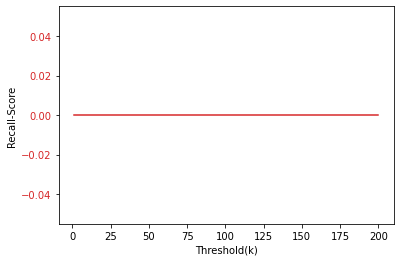

Recall Score Graph for Documents 8


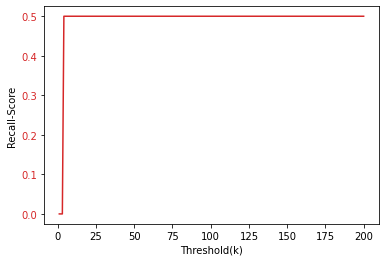

Recall Score Graph for Documents 9


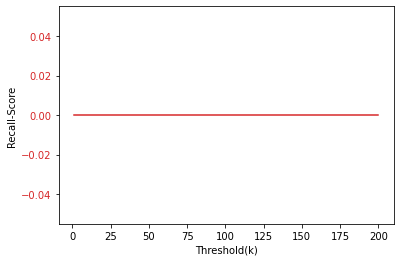

Recall Score Graph for Documents 10


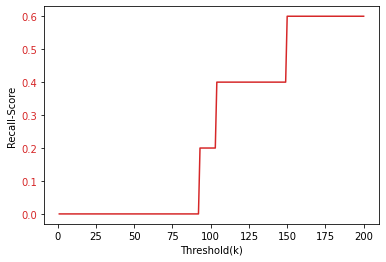

Recall Score Graph for Documents 11


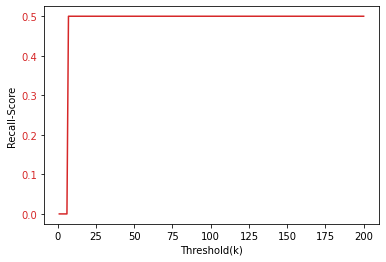

Recall Score Graph for Documents 12


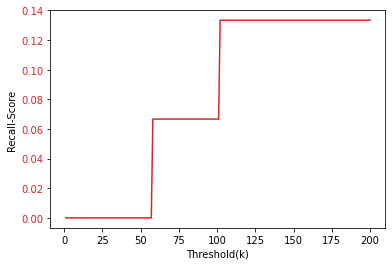

Recall Score Graph for Documents 13


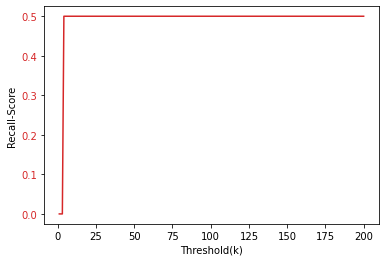

Recall Score Graph for Documents 14


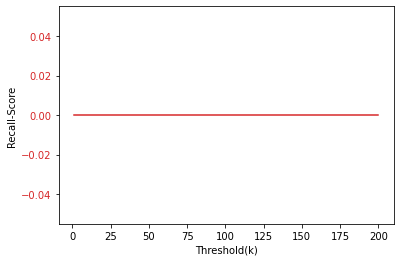

Recall Score Graph for Documents 15


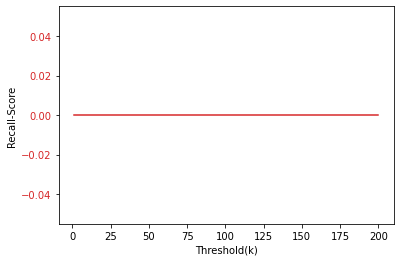

Recall Score Graph for Documents 16


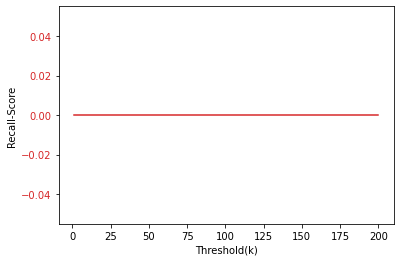

Recall Score Graph for Documents 17


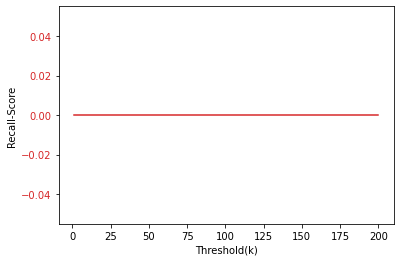

Recall Score Graph for Documents 18


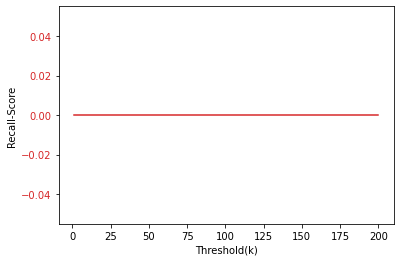

In [203]:
import matplotlib.pyplot as plt

for i in range(len(recall_values_new)):
    print("Recall Score Graph for Documents " + str(i))
    t = [x for x in range(1,201)]
    data = recall_values_new[i]
#     fig, ax1 = plt.subplots()

    color = 'tab:red'
    plt.xlabel("Threshold(k)")
    plt.ylabel("Recall-Score")
    plt.plot(t, data, color=color)
    plt.tick_params(axis='y', labelcolor=color)
    plt.show()